In [1]:
#! Setup
%matplotlib inline
import matplotlib
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import seaborn as sns#nicer plots?
sns.reset_orig()
import scipy.stats as sps
from scipy.stats import chi
import scipy as sp
from scipy import signal
from sklearn import linear_model
import pickle
import datetime
import time
import os
fig_size = [18,18]
plt.rcParams["figure.figsize"] = fig_size

# Tensorflow needs to be LAST import
import tensorflow as tf
print(tf.__version__)

/usr/local/lib/python3.4/dist-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


1.0.0


In [2]:
#! Loading the data from VGG Conv2 activations

#4 types:
Data=np.load('/gpfs01/bethge/home/dklindt/David//publish/data.npz')

print(Data.keys())
Y=Data.f.responses
Y=Y.T# N x D
X=Data.f.images
X=np.transpose(X,axes=[0,3,1,2])# NCHW
loc_y=Data.f.loc_y
loc_x=Data.f.loc_x
feature_maps=Data.f.feature_maps

['images', 'responses', 'loc_y', 'loc_x', 'feature_maps']


# Preprocessing and Model 

In [3]:
#! splits data into train,val,test and adds poisson-like noise
def splitting_data(X,Y,num_train,num_val,num_test=2**10,noise=True,mean_response=.1):
    
    N=Y.shape[0]#number of neurons
    
    X_train=X[:num_train,:,:,:]
    X_val=X[num_train:num_train+num_val,:,:,:]
    X_test=X[num_train+num_val:num_train+num_val+num_test,:,:,:]
    
    Y_train=np.zeros([N,num_train])
    Y_val=np.zeros([N,num_val])
    #Y_test=np.zeros([N,num_test])
    GT_test=np.zeros([N,num_test])
    
    for n in range(1000):
        tmp_mean = np.mean(Y[n,:])
        Y_train[n,:] = Y[n,:num_train] / tmp_mean * mean_response
        Y_val[n,:] = Y[n,num_train:num_train+num_val] / tmp_mean * mean_response
        GT_test[n,:] = Y[n,num_train+num_val:num_train+num_val+num_test] / tmp_mean * mean_response
    
    #Poisson-like noise
    if noise:
        Y_train += np.random.normal(0,np.sqrt(np.abs(Y_train)),Y_train.shape)
        Y_val +=  np.random.normal(0,np.sqrt(np.abs(Y_val)),Y_val.shape)
        #Y_test =  GT_test + np.random.normal(0,np.sqrt(np.abs(GT_test)),GT_test.shape)
    
    #Poisson noise
    #if noise:
    #    Y_train += np.random.poisson(Y_train)
    #    Y_val +=  np.random.poisson(Y_val)
    #    Y_test =  GT_test + np.random.poisson(GT_test)
    
    return Y_train,Y_val,X_train,X_val,X_test,GT_test#,Y_test

In [4]:
#! Spike triggered average - as initialization or else
def STA(X,Y,crop,s2=13):
    #In:
    #X - stimuli, stimulus_size x number_of_data
    #Y - responses, number_of_neurons x number_of_data
    #smooth - size of smoothing gaussian (=s2), if not provided, no smoothing
    #Out
    #sta - spike triggered average, number_of_neurons x stimulus_size
    s=np.sqrt(X.shape[0]).astype(int)
    d=X.shape[1]
    n=Y.shape[0]
    
    sta = ((X.dot(Y.T))/Y.shape[1]).T
    sta = sta.reshape([n,s*s])
    
    #Smoothing
    x = np.linspace(1, s2, s2)
    y = np.linspace(s2, 1, s2)
    xm, ym = np.meshgrid(x, y)

    centre = [s2/2+.5, s2/2+.5]
    ind_tmp = (np.abs(xm-centre[0]) < s2) & (np.abs(ym-centre[1]) < s2)
    rf_tmp = np.zeros((s2,s2))
    rf_tmp[ind_tmp] = np.sqrt( (centre[0] - xm[ind_tmp])**2 +
                      (centre[1] - ym[ind_tmp])**2 )
    rf_tmp[ind_tmp] = (sps.norm.pdf(rf_tmp[ind_tmp],0,s2**(1/4)))

    normal=rf_tmp
    #plt.imshow(normal)
    #plt.show()
    sta_smooth=np.zeros(sta.shape)
    sta_r1=np.zeros([n,s,s])
    for i in range(n):
        sta_smooth[i,:] = signal.convolve2d(((sta[i,:])**2).reshape([s,s]),
            normal,mode='same').reshape(s**2)
        #rank one approx
        U,S,V = np.linalg.svd(sta[i,:].reshape(s,s))
        S1 = np.zeros(S.shape)
        S1[0] = S[0]
        tmp1 = U.dot(np.diag(S1).dot(V))
        sta_r1[i,:,:] = signal.convolve2d((tmp1**2),
            normal,mode='same')
        
    
    
    #cropping
    ind = np.int((s-crop)/2)
    sta = sta.reshape([n,s,s])
    sta = sta[:,ind:s-ind,ind:s-ind]
    sta = sta.reshape([n,crop**2])
    sta_s = sta_smooth.reshape([n,s,s])
    sta_s = sta_s[:,ind:s-ind,ind:s-ind]
    sta_s = sta_s.reshape([n,crop**2])
    sta_r1 = sta_r1[:,ind:s-ind,ind:s-ind]
    sta_r1 = sta_r1.reshape([n,crop**2])
        
    return sta, sta_s#, sta_r1


#######rank one approx
'''
for i in range(3):
    tmp = tmp_sta[356+i,:].reshape(32,32).copy()
    plt.imshow(tmp)
    plt.show()
    u,s,v = np.linalg.svd(tmp)
    print(u.shape,s.shape,v.shape)
    s1 = np.zeros(s.shape)
    s1[0] = s[0]
    tmp1 = u.dot(np.diag(s1).dot(v))
    plt.imshow(tmp1)
    plt.show()
'''

'\nfor i in range(3):\n    tmp = tmp_sta[356+i,:].reshape(32,32).copy()\n    plt.imshow(tmp)\n    plt.show()\n    u,s,v = np.linalg.svd(tmp)\n    print(u.shape,s.shape,v.shape)\n    s1 = np.zeros(s.shape)\n    s1[0] = s[0]\n    tmp1 = u.dot(np.diag(s1).dot(v))\n    plt.imshow(tmp1)\n    plt.show()\n'

In [5]:
#! Model tensorflow - mask: trainable:False
from tensorflow.contrib import layers
class ModelGraph:
    def __init__(self, s, rM, rW, init_scaleK, init_scaleM,init_scaleW, N, num_kern,
                 init_mask=np.array([]),
                 init_weights=np.array([]), init_kernel=np.array([])):
        #Inputs:
        #        s*s - size of the image
        #        s2*s2 - size of the kernel
        #        rM/W - regularization weight Mask / Weights
        #        N - number of neurons
        #        num_kern - number of kernels per conv layer
        
        self.graph = tf.Graph()#new tf graph
        with self.graph.as_default():#use it as default
        
            #input tensor of shape NCHW!
            self.X = tf.placeholder(tf.float32,shape=[None,3,s[0],s[0]])
            #output: N x None
            self.Y = tf.placeholder(tf.float32)             
            
            #WK Kernel - filter / tensor of shape H-W-InChannels-OutChannels
                
            #WW - Read Out Weights
            if init_weights.size:
                self.WW_init = init_weights
            else:
                self.WW_init = tf.random_normal([num_kern[-1],N],
                                                init_scaleW[0],init_scaleW[1])
            
            #WM - Mask
            if init_mask.size:
                self.WM_init = init_mask
            else:
                self.WM_init = tf.random_normal([s[2]**2,N],0,init_scaleM)
        
            #batch normalization settings
            self.istrain = tf.placeholder(tf.bool)
            
            bn_params = dict(center=True,
                             scale=False,
                             is_training=self.istrain,
                             variables_collections=['batch_norm_ema'])
            
            #Layer: Conv1
            self.conv1 = layers.convolution2d(
                inputs=self.X,
                data_format='NCHW',
                num_outputs=num_kern[0],
                kernel_size=s[1],
                stride=1,
                padding='VALID',
                activation_fn=tf.nn.relu,#None
                normalizer_fn=layers.batch_norm,
                normalizer_params=bn_params,
                weights_initializer=tf.random_normal_initializer(stddev=init_scaleK),
                scope='conv1')
            with tf.variable_scope('conv1', reuse=True):
                self.WK1 = tf.get_variable('weights')
                
            #Layer: Conv2
            self.conv2 = layers.convolution2d(
                inputs=self.conv1,
                data_format='NCHW',
                num_outputs=num_kern[1],
                kernel_size=s[1],
                stride=1,
                padding='VALID',
                activation_fn=tf.nn.relu,#None
                normalizer_fn=layers.batch_norm,
                normalizer_params=bn_params,
                weights_initializer=tf.random_normal_initializer(stddev=init_scaleK),
                scope='conv2')
            with tf.variable_scope('conv2', reuse=True):
                self.WK2 = tf.get_variable('weights')
                
            #Layer: Conv3
            self.conv3 = layers.convolution2d(
                inputs=self.conv2,
                data_format='NCHW',
                num_outputs=num_kern[2],
                kernel_size=s[1],
                stride=1,
                padding='VALID',
                activation_fn=tf.nn.relu,#None
                normalizer_fn=layers.batch_norm,
                normalizer_params=bn_params,
                weights_initializer=tf.random_normal_initializer(stddev=init_scaleK),
                scope='conv3')
            with tf.variable_scope('conv3', reuse=True):
                self.WK3 = tf.get_variable('weights')
            
            #batch_norm op
            self.update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
            
            #Location layer - each neuron has one location mask
            self.WM = tf.Variable(self.WM_init,dtype=tf.float32, name='WM',trainable=False)
            self.mask = tf.reshape(tf.matmul(tf.reshape(self.conv3,[-1,s[2]**2]),
                                   self.WM),[-1,num_kern[-1],N])
            
            #Weighing Layer
            self.WW = tf.Variable(self.WW_init,dtype=tf.float32, name='WW')
            #self.WWn = self.WW# / tf.sqrt(tf.reduce_sum(tf.square(self.WW),0,keep_dims=True))
            self.WWn = tf.abs(self.WW)
            
            #Predicted Output
            self.Y_ = tf.squeeze(tf.transpose(tf.reduce_sum(tf.multiply(self.mask,
                            self.WWn), 1, keep_dims=True)))#N x D
            
            #Regularization
            self.regM = tf.reduce_sum(tf.abs(self.WM)) #L1 Loss on mask
            self.regW = tf.reduce_sum(tf.abs(self.WW)) #L1 Loss on read out weights
            
            #Define a loss function
            self.res = self.Y_-self.Y
            self.MSE = tf.reduce_sum(tf.reduce_mean(self.res * self.res,1))
            #self.poisson = tf.reduce_sum(tf.nn.log_poisson_loss(tf.log(self.Y_),self.Y))
            self.loss = self.MSE + rM*self.regM + rW*self.regW
            
            #Define a training graph
            self.step_size= tf.placeholder(tf.float32)
            self.training = tf.train.AdamOptimizer(self.step_size).minimize(self.loss)
            #self.training_noM = tf.train.AdamOptimizer(self.step_size).minimize(self.loss,
            #                                   var_list=[self.WK,self.WW])
            
            # Create a saver.
            self.saver = tf.train.Saver()

In [6]:
#! Training CNN-NL
def train(init_scaleK,init_scaleM,init_scaleW,init_lr,num_kern,max_runs,rM,rW,s,N,
          X_train,X_val,X_test,Y_train,Y_val,GT_test,batch_size,verbose=False):
    
    #Storing:
    MSE_train = [] # MSE on train set, reps x runs/100
    tmp_MT = []#dummy for storing the above during repetition for Xruns
    MSE_val = []#MSE on validation set, reps x runs/100
    tmp_MV = []#dummy for storing the above during repetition for Xruns
    MSE_test = []#MSE on test set, reps x 1
    WK1 = []# Kernel - store best weights, reps x s2 x s2
    tmp_WK1 = []#dummy during run
    WK2 = []# Kernel - store best weights, reps x s2 x s2
    tmp_WK2 = []#dummy during run
    WK3 = []# Kernel - store best weights, reps x s2 x s2
    tmp_WK3 = []#dummy during run
    WW = []# Read Out Weights - store best weights, reps x s x s
    tmp_WW = []#dummy during run
    WM = []# Mask
    tmp_WM = []
    FEV = []#fraction of explained variance, reps x 1

    #calculate test variance
    gt_test_var = np.sum(np.var(GT_test,axis =1))#explainable output variance
    
    #initialize current attributes
    lr=init_lr
    # flags for early stopping
    stop_flag = 0
    sstop=0

    #Init Mask weights
    #STA - maximum pixel, use the smoothed STA, better estimation, see above!
    tmp = np.random.normal(0,init_scaleM,tmp_sta.shape)
    tmp[np.arange(N),np.argmax(abs(tmp_sta),1)] = np.ones(N)
    init_mask = tmp.astype(np.float32).T
    
    #init Weights
    init_weights = (np.ones([num_kern[-1],N])*init_scaleW[0]).astype(np.float32)
    if init_scaleW[1]>0:
        init_weights = np.random.normal(init_scaleW[0],init_scaleW[1],[num_kern[-1],N])
    
    #Init model class
    model = ModelGraph(s,rM,rW,init_scaleK,init_scaleM,init_scaleW,
                       N,num_kern,init_mask,init_weights=init_weights)#,init_kernel)

    #validation feed can be outside loop:
    #feed_val = {model.X:X_val,
    #            model.Y:Y_val,model.istrain:False}
    #feed_test = {model.X:X_test,model.Y:GT_test,model.istrain:False}
    
    #Split up because too large for GPU memory...
    num_test=np.int(GT_test.shape[1]/batch_size)
    feed_test=[]
    for i in range(num_test):
        feed_test.append( {model.X:X_test[i*batch_size:(i+1)*batch_size,:,:,:],
                        model.Y:GT_test[:,i*batch_size:(i+1)*batch_size],model.istrain:False})
    num_val=np.int(Y_val.shape[1]/batch_size)
    feed_val=[]
    for i in range(num_val):
        feed_val.append( {model.X:X_val[i*batch_size:(i+1)*batch_size,:,:,:],
                        model.Y:Y_val[:,i*batch_size:(i+1)*batch_size],model.istrain:False})
    
    ##Start a tf session
    with model.graph.as_default():
        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())
            
            #plot initial weights
            if verbose:
                print('Before Training:')
                fig, ax = plt.subplots(1, 4, figsize=[18, 3])
                #tmp_wk=model.WK1.eval().reshape([s[1],s[1],3,
                #     num_kern[0]])[:,:,0,:].reshape([s2**2,num_kern[0]]).T
                b=-1
                tmp_ww=model.WW.eval()
                tmp_wm=model.WM.eval()[:,0].T#first neuron as example
                #for b in range(num_kern[0]):
                #    ax[b].imshow(tmp_wk[b,:].reshape([s[1],s[1]]),cmap='bwr',
                #                vmin=-max(abs(tmp_wk[b,:])),vmax=max(abs(tmp_wk[b,:])))
                #    ax[b].get_xaxis().set_visible(False)
                #    ax[b].get_yaxis().set_visible(False)
                #    ax[b].set_title('Kernel')
                ax[1+b].plot(tmp_ww[:,0])
                ax[1+b].set_title('Weights N_1')
                ax[2+b].imshow(tmp_wm.reshape([s[2],s[2]]),cmap='bwr',
                    vmin=-max(abs(tmp_wm.T)),vmax=max(abs(tmp_wm.T)))
                ax[2+b].get_xaxis().set_visible(False)
                ax[2+b].get_yaxis().set_visible(False)
                ax[2+b].set_title('Mask N_1')
                test=np.zeros(num_test*batch_size)
                for i in range(num_test):
                    test[i*batch_size:(i+1)*batch_size]=sess.run(model.Y_,feed_test[i])[0]
                ax[3+b].plot(GT_test[0], test, '.')
                #ax[3+b].plot(GT_test[0], sess.run(model.Y_,feed_test)[0], '.')
                xx = [-.4, .4]
                ax[3+b].plot(xx, xx)
                ax[3+b].axis('equal')
                ax[3+b].set_title('true vs predicted')
                ax[4+b].plot(tmp_ww)
                ax[4+b].set_title('All Weights')
                plt.show()
                print('Loss: %s mask'%(model.regM.eval()*rM),
                      'Loss: %s weights'%(model.regW.eval()*rW))

            #Batches - define list of starting-indices for individual batches in data set:
            #if there is less training data than batch size
            batch_size = np.min([batch_size,X_train.shape[0]])
            batch_ind = np.arange(0,X_train.shape[0],batch_size)
            #number of selected batch
            batch = 0

            #Optimization runs
            #minimal verbose
            #verb_time=0
            #from IPython import display
            #fig,ax=plt.subplots(1,2, figsize=[10, 5])
            for j in range(1,max_runs):

                #when there is no further complete batch
                if batch==len(batch_ind):
                    #shuffle data and start again:
                    ind = np.random.permutation(X_train.shape[0])
                    X_train = X_train[ind,:,:,:]
                    Y_train = Y_train[:,ind]
                    batch = 0

                #take a batch
                X_batch = X_train[batch_ind[batch]:batch_ind[batch]+batch_size,:,:,:]
                Y_batch = Y_train[:,batch_ind[batch]:batch_ind[batch]+batch_size]
                batch +=1
                
                #Training feed:
                feed_dict ={model.step_size:lr,model.X:X_batch,
                            model.Y:Y_batch,model.istrain:True}

                # Training with current batch:
                sess.run([model.training, model.update_ops],feed_dict)
                
                #Early Stopping - check if MSE doesn't increase
                if j%100==0:

                    model.saver.save(sess, 'Batty_bn_checkpoint', global_step=int(j/100))

                    #exponentially decreasing learning rate?
                    #lr *= .99

                    # Store MSE on train:
                    
                    tmp_MT.append(model.MSE.eval(feed_dict))

                    #check MSE on validation set and store the parameters
                    #tmp_MV.append(model.MSE.eval(feed_val))
                    val=np.zeros(num_val)
                    for i in range(num_val):
                        val[i]=sess.run(model.MSE,feed_val[i])
                    tmp_MV.append(np.mean(val))
                    tmp_WK1.append(model.WK1.eval())
                    tmp_WK2.append(model.WK2.eval())
                    tmp_WK3.append(model.WK3.eval())
                    tmp_WW.append(model.WW.eval())
                    tmp_WM.append(model.WM.eval())

                    #Best run
                    if len(tmp_MV)>5:#burn in 
                        tmp_min_ind = np.argmin(tmp_MV[5:])+5
                    else:
                        tmp_min_ind = len(tmp_MV)-1
                        
                    #minimal verbose
                    #start=time.time()
                    #print('run=%s,lr=%s,MSE-train=%s,MSE-val=%s'%(j,lr,
                    #            tmp_MT[-1],tmp_MV[-1]))
                    if j>99100:
                        #test=np.zeros(num_test)
                        #for i in range(num_test):
                        #    test[i]=sess.run(model.MSE,feed_test[i])
                        #MSE_test = np.mean(test)
                        
                        ax[0].plot(np.arange(len(tmp_MT)-1),tmp_MT[1:],'r')
                        ax[0].plot(np.arange(len(tmp_MT)-1),tmp_MV[1:],'g')
                        ax[0].legend(['Train MSE','Val MSE'])
                        #ax[0].legend(['Val MSE'])
                        ax[0].set_title('run=%s,lr=%s,plot_time=%s,MSE-train=%s,MSE-val=%s'%(j,
                                      lr,np.round(verb_time),tmp_MT[-1],tmp_MV[-1]))
                        #ax[1].set_title('MSE-val=%s, FEV=%s'%(tmp_MV[-1],
                        #        (1 - (MSE_test/gt_test_var))))
                        
                    #verb_time+=time.time()-start

                    ##Analytics - Display progress
                    if verbose:
                        #to calculate FEV
                        test=np.zeros(num_test)
                        for i in range(num_test):
                            test[i]=sess.run(model.MSE,feed_test[i])
                        MSE_gt = np.mean(test)
                        print('Runs: %s; MSE - train: %s, val: %s; lr = %s'%
                              (j,tmp_MT[-1],tmp_MV[-1],lr))
                        print('Loss: %s mask'%(model.regM.eval()*rM),
                              'Loss: %s weights'%(model.regW.eval()*rW))
                        print('latest: ',tmp_MV[-1])
                        print('FEV = ',(1 - (MSE_gt/gt_test_var)))
                        #print(len(tmp_MV),tmp_min_ind)
                        print('best: ',tmp_min_ind,tmp_MV[tmp_min_ind])

                        #Plot learned weight example
                        fig, ax = plt.subplots(1, 5, figsize=[18, 3])
                        #tmp_wk=model.WK1.eval().reshape([s[1],s[1],3,
                        # num_kern[0]])[:,:,0,:].reshape([s[1]**2,num_kern[0]]).T
                        tmp_ww=model.WW.eval()
                        tmp_wm=model.WM.eval()[:,0].T#first neuron as example
                        #for b in range(num_kern[0]):
                        #    ax[b].imshow(tmp_wk[b,:].reshape([s[1],s[1]]),cmap='bwr',
                        #                vmin=-max(abs(tmp_wk[b,:])),vmax=max(abs(tmp_wk[b,:])))
                        #    ax[b].get_xaxis().set_visible(False)
                        #    ax[b].get_yaxis().set_visible(False)
                        #    ax[b].set_title('Kernel')
                        b=-1
                        ax[1+b].plot(tmp_ww[:,0])
                        ax[1+b].set_title('Weights N_1')
                        ax[2+b].imshow(tmp_wm.reshape([s3,s3]),cmap='bwr',
                            vmin=-max(abs(tmp_wm.T)),vmax=max(abs(tmp_wm.T)))
                        ax[2+b].get_xaxis().set_visible(False)
                        ax[2+b].get_yaxis().set_visible(False)
                        ax[2+b].set_title('Mask N_1')
                        ax[2+b].axhline(y=loc_y[0]+1, xmin=0, xmax=32, linewidth=1, color = 'g')
                        ax[2+b].axvline(x=loc_x[0]-1, ymin=0, ymax =32, linewidth=1, color='g')
                        test=np.zeros(num_test*batch_size)
                        for i in range(num_test):
                            test[i*batch_size:(i+1)*batch_size]=sess.run(model.Y_,feed_test[i])[0]
                        ax[3+b].plot(GT_test[0], test, '.')
                        #ax[3+b].plot(GT_test[0], sess.run(model.Y_,feed_test)[0], '.')
                        xx = [-.4, .4]
                        ax[3+b].plot(xx, xx)
                        ax[3+b].axis('equal')
                        ax[3+b].set_title('true vs predicted')
                        ax[4+b].plot(tmp_ww[:,:250],'r')
                        ax[4+b].plot(tmp_ww[:,250:500],'b')
                        ax[4+b].plot(tmp_ww[:,500:750],'y')
                        ax[4+b].plot(tmp_ww[:,750:],'g')
                        ax[4+b].set_title('All Weights')
                        ax[5+b].plot(tmp_MV)
                        ax[5+b].plot(tmp_MT)
                        ax[5+b].set_ylim([min(tmp_MT),2*np.median(tmp_MV)-min(tmp_MT)])
                        ax[5+b].legend(['MSE Val','MSE Train'])
                        plt.show()

                    ##Early Stopping - if latest validation MSE is not minimum
                    if tmp_min_ind != len(tmp_MV)-1:
                        stop_flag +=1
                        if stop_flag>=8:
                            lr *= .1
                            #set back to previous best?
                            #model.saver.restore(sess, 'bn_checkpoint-%s'%(tmp_min_ind+1))
                            #print('back to MSE-val = ',model.MSE_test.eval(feed_val))
                            stop_flag = 0
                            sstop +=1
                            if sstop==3:#lower the lr x times
                                break
                                
                    else:#if latest value is best, reset
                        stop_flag = 0

            #Best run
            tmp_min_ind = np.argmin(tmp_MV)

            #Store MSEs
            MSE_train = tmp_MT#list
            MSE_val = tmp_MV#list
            
            #Store best weights (i.e. lowest validation MSE)
            WK1 = tmp_WK1[tmp_min_ind]#s2 x s2
            WK2 = tmp_WK2[tmp_min_ind]#s2 x s2
            WK3 = tmp_WK3[tmp_min_ind]#s2 x s2
            WW = tmp_WW[tmp_min_ind]# N x s*s
            WM = tmp_WM[tmp_min_ind]# num_kern x N

            #Assign the best weights to model graph 
            model.saver.restore(sess, './Batty_bn_checkpoint-%s'%(tmp_min_ind+1))
            
            #clean checkpoints
            files = os.listdir()
            for file in files:
                if file.startswith("Batty_bn_checkpoint"):
                    os.remove(file)
                    
            # Test MSE prediction
            #MSE_test = sess.run(model.MSE,feed_test)#1 x 1
            test=np.zeros(num_test)
            #test_L=np.zeros(num_test)
            for i in range(num_test):
                test[i]=sess.run(model.MSE,feed_test[i])
            #    test_L[i]=sess.run(model.poisson,feed_test[i])
            MSE_test = np.mean(test)
            #Loss_test = np.mean(Loss)
            
            #FEV - fraction of explainable variance
            FEV = 1 - (MSE_test/gt_test_var)#1 x 1

            #Predicted outputs
            #Y_ = sess.run(model.Y_,feed_test)
            test=np.zeros([N,num_test*batch_size])
            for i in range(num_test):
                test[:,i*batch_size:(i+1)*batch_size]=sess.run(model.Y_,feed_test[i])
            Y_ = test
            
            #FEV per cell
            fev_cell=1-(np.mean((Y_-GT_test)**2,1)/np.var(GT_test,1))

            #Output
            log=('Stop at run %s; MSE on validation set: %s'% (j,MSE_val[tmp_min_ind]),
                  'MSE on test set: %s; FEV: %s' % (MSE_test, FEV))
            print(log)

    return (WK1,WK2,WK3,WM,WW,MSE_train,MSE_val,MSE_test,FEV,fev_cell,Y_,log)

# Exploration

Before Training:


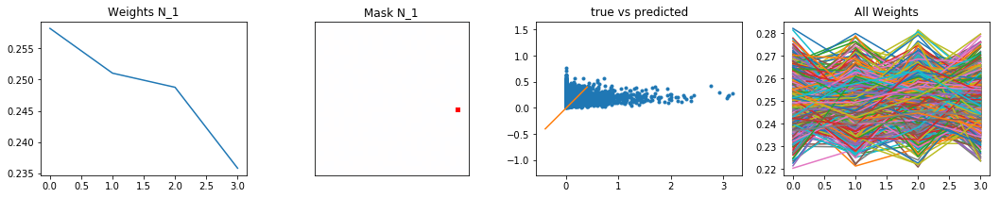

Loss: 0.0 mask Loss: 5.00667297363 weights
Runs: 100; MSE - train: 187.433, val: 447.989312172; lr = 0.001
Loss: 0.0 mask Loss: 3.98418395996 weights
latest:  447.989312172
FEV =  -3.33268698787
best:  0 447.989312172


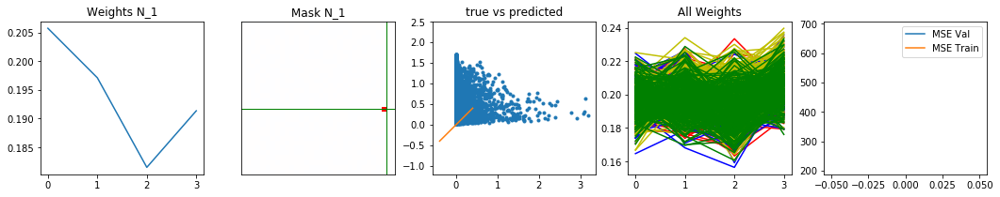

Runs: 200; MSE - train: 192.305, val: 231.304364681; lr = 0.001
Loss: 0.0 mask Loss: 3.5534866333 weights
latest:  231.304364681
FEV =  -0.685225039575
best:  1 231.304364681


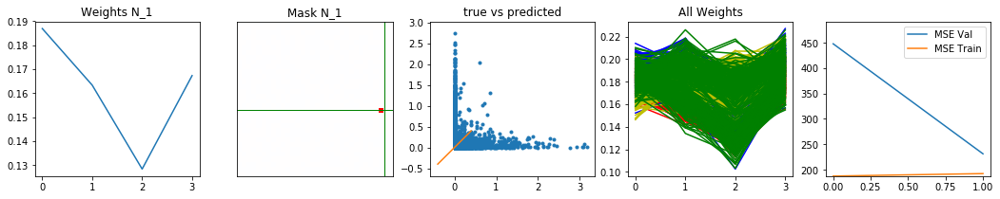

Runs: 300; MSE - train: 168.525, val: 178.007443428; lr = 0.001
Loss: 0.0 mask Loss: 3.22812255859 weights
latest:  178.007443428
FEV =  0.0237217651565
best:  2 178.007443428


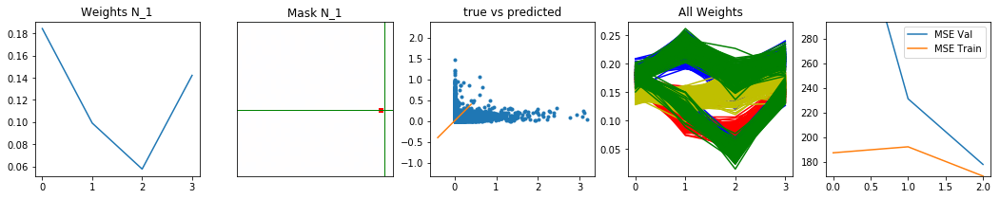

Runs: 400; MSE - train: 147.329, val: 157.320046902; lr = 0.001
Loss: 0.0 mask Loss: 2.79167388916 weights
latest:  157.320046902
FEV =  0.283395415803
best:  3 157.320046902


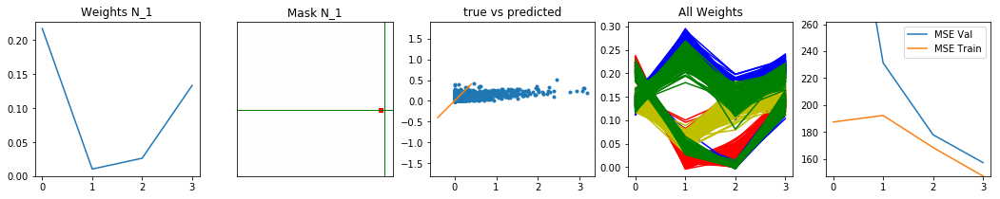

Runs: 500; MSE - train: 146.566, val: 157.451352119; lr = 0.001
Loss: 0.0 mask Loss: 2.45490814209 weights
latest:  157.451352119
FEV =  0.280043716661
best:  4 157.451352119


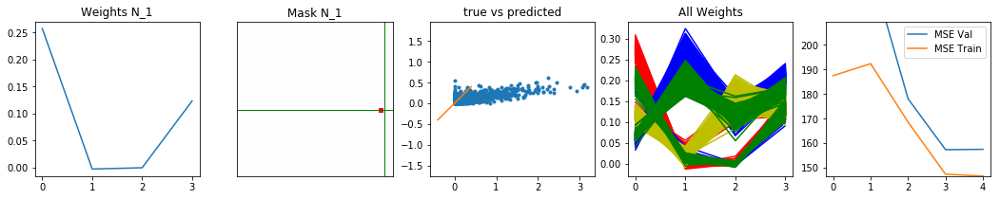

Runs: 600; MSE - train: 150.341, val: 158.914982557; lr = 0.001
Loss: 0.0 mask Loss: 2.17309082031 weights
latest:  158.914982557
FEV =  0.261122421295
best:  5 158.914982557


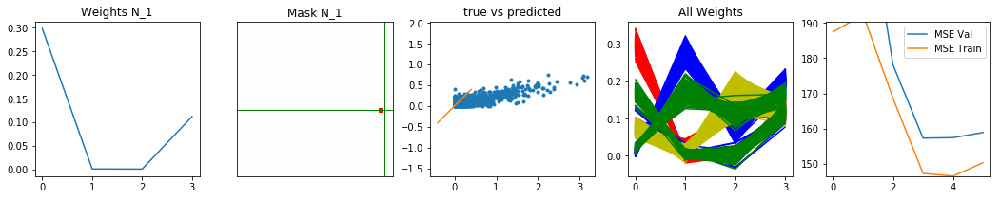

Runs: 700; MSE - train: 135.332, val: 156.745167494; lr = 0.001
Loss: 0.0 mask Loss: 1.99985809326 weights
latest:  156.745167494
FEV =  0.287928073377
best:  6 156.745167494


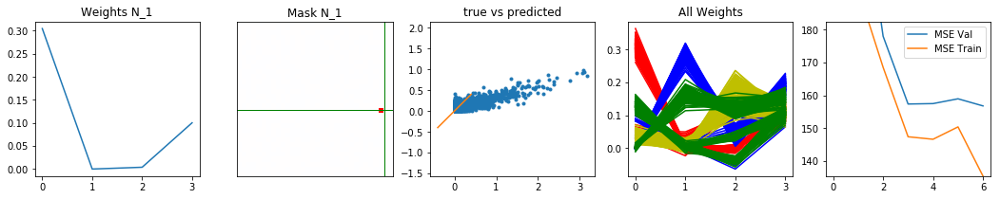

Runs: 800; MSE - train: 130.868, val: 152.851433516; lr = 0.001
Loss: 0.0 mask Loss: 1.88983642578 weights
latest:  152.851433516
FEV =  0.336573082405
best:  7 152.851433516


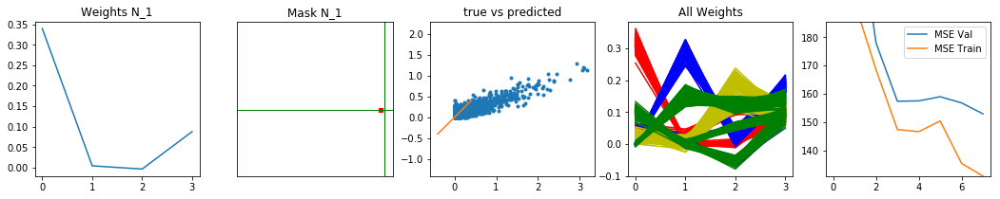

Runs: 900; MSE - train: 153.92, val: 149.631190658; lr = 0.001
Loss: 0.0 mask Loss: 1.79677398682 weights
latest:  149.631190658
FEV =  0.376649501175
best:  8 149.631190658


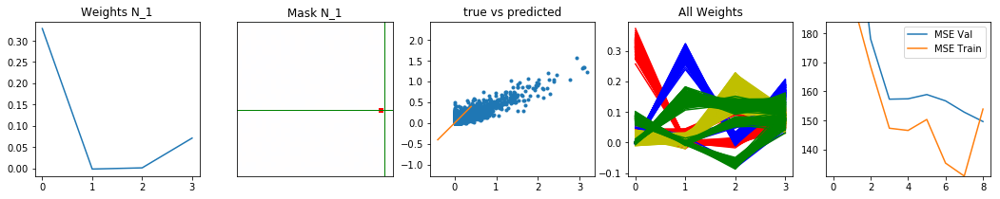

Runs: 1000; MSE - train: 117.36, val: 148.078532219; lr = 0.001
Loss: 0.0 mask Loss: 1.71419494629 weights
latest:  148.078532219
FEV =  0.396042513963
best:  9 148.078532219


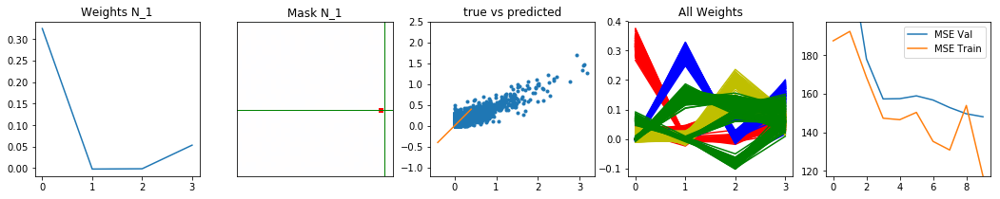

Runs: 1100; MSE - train: 139.181, val: 147.418328047; lr = 0.001
Loss: 0.0 mask Loss: 1.63025466919 weights
latest:  147.418328047
FEV =  0.404766633427
best:  10 147.418328047


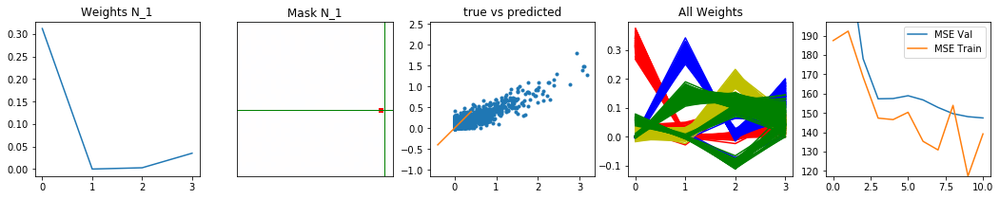

Runs: 1200; MSE - train: 148.227, val: 142.330757856; lr = 0.001
Loss: 0.0 mask Loss: 1.53885253906 weights
latest:  142.330757856
FEV =  0.467995535425
best:  11 142.330757856


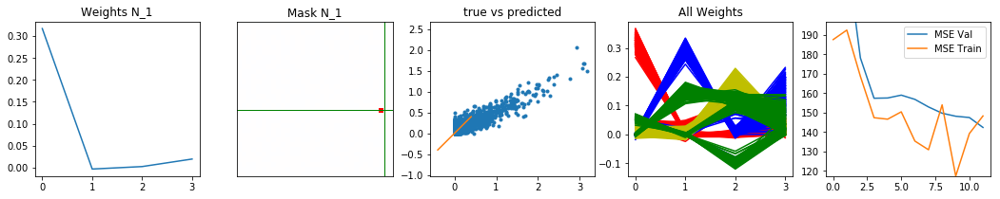

Runs: 1300; MSE - train: 124.42, val: 142.255751491; lr = 0.001
Loss: 0.0 mask Loss: 1.4853163147 weights
latest:  142.255751491
FEV =  0.469724284967
best:  12 142.255751491


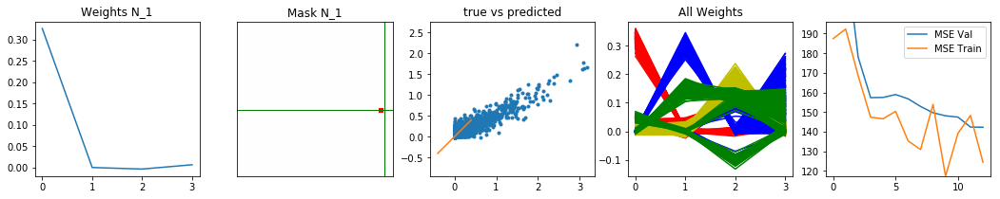

Runs: 1400; MSE - train: 132.824, val: 138.513011932; lr = 0.001
Loss: 0.0 mask Loss: 1.50968170166 weights
latest:  138.513011932
FEV =  0.517528187399
best:  13 138.513011932


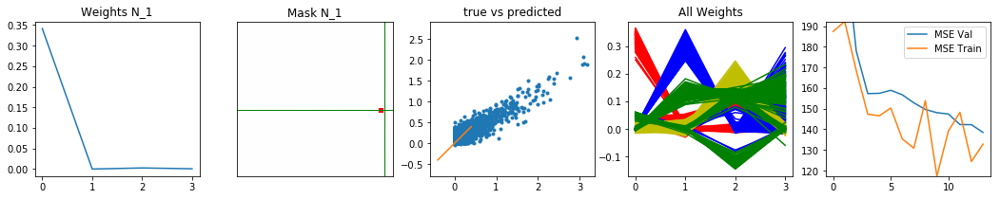

Runs: 1500; MSE - train: 139.223, val: 136.199762464; lr = 0.001
Loss: 0.0 mask Loss: 1.54009735107 weights
latest:  136.199762464
FEV =  0.546741780326
best:  14 136.199762464


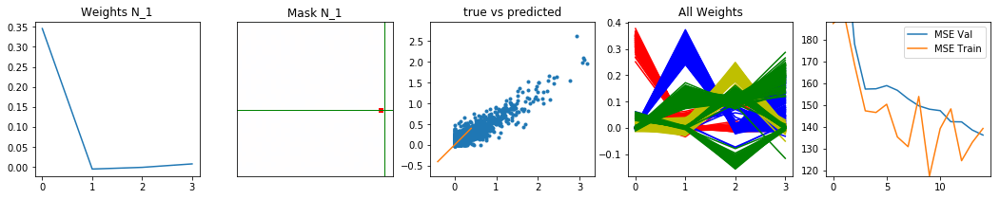

Runs: 1600; MSE - train: 123.562, val: 134.032567143; lr = 0.001
Loss: 0.0 mask Loss: 1.54778289795 weights
latest:  134.032567143
FEV =  0.574433183142
best:  15 134.032567143


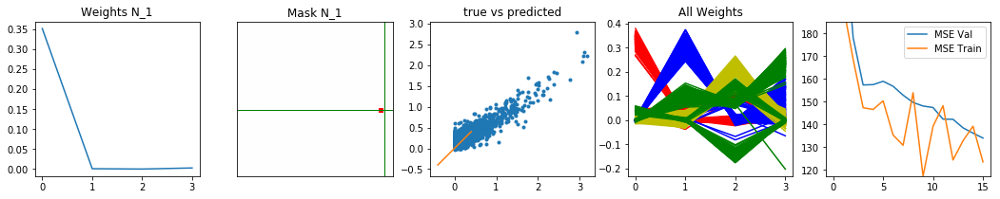

Runs: 1700; MSE - train: 132.186, val: 132.520587325; lr = 0.001
Loss: 0.0 mask Loss: 1.54614532471 weights
latest:  132.520587325
FEV =  0.594128851719
best:  16 132.520587325


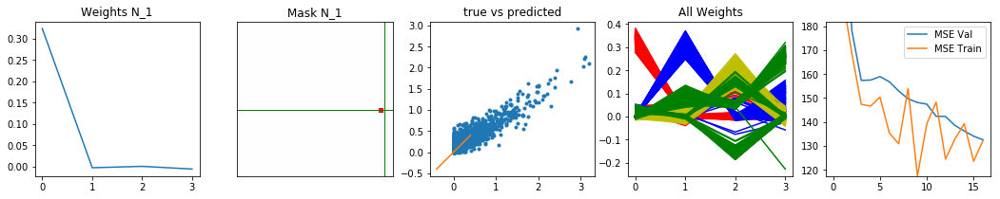

Runs: 1800; MSE - train: 135.545, val: 130.564804316; lr = 0.001
Loss: 0.0 mask Loss: 1.53561050415 weights
latest:  130.564804316
FEV =  0.619213231456
best:  17 130.564804316


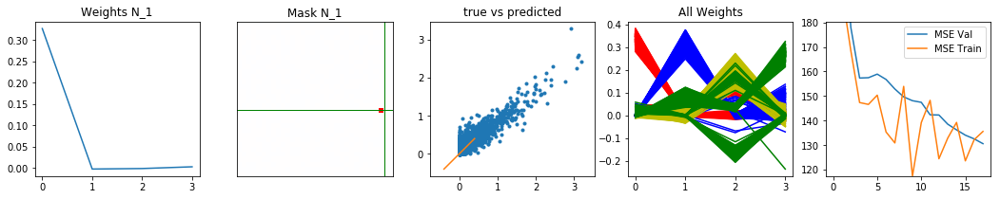

Runs: 1900; MSE - train: 115.651, val: 129.768179059; lr = 0.001
Loss: 0.0 mask Loss: 1.5352116394 weights
latest:  129.768179059
FEV =  0.630085789985
best:  18 129.768179059


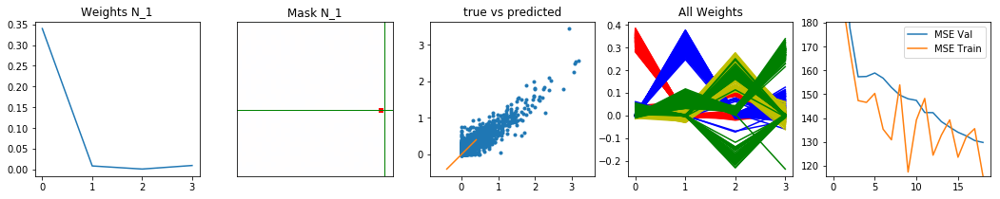

Runs: 2000; MSE - train: 119.787, val: 129.550079703; lr = 0.001
Loss: 0.0 mask Loss: 1.53301696777 weights
latest:  129.550079703
FEV =  0.633143957156
best:  19 129.550079703


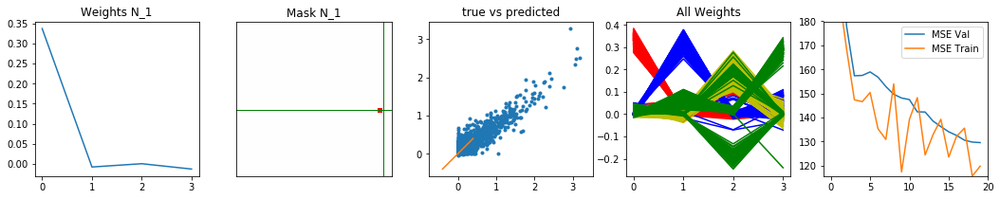

Runs: 2100; MSE - train: 137.053, val: 128.82484448; lr = 0.001
Loss: 0.0 mask Loss: 1.530262146 weights
latest:  128.82484448
FEV =  0.642324603762
best:  20 128.82484448


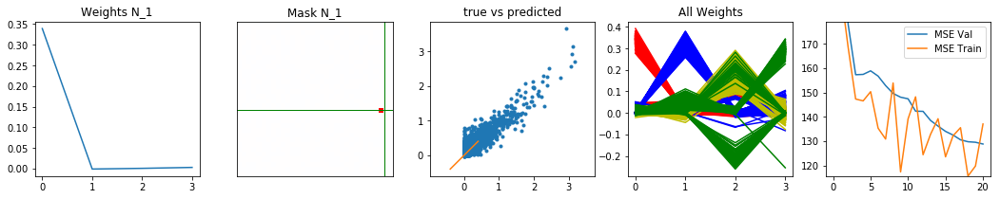

Runs: 2200; MSE - train: 109.658, val: 128.630997062; lr = 0.001
Loss: 0.0 mask Loss: 1.53013320923 weights
latest:  128.630997062
FEV =  0.645238195465
best:  21 128.630997062


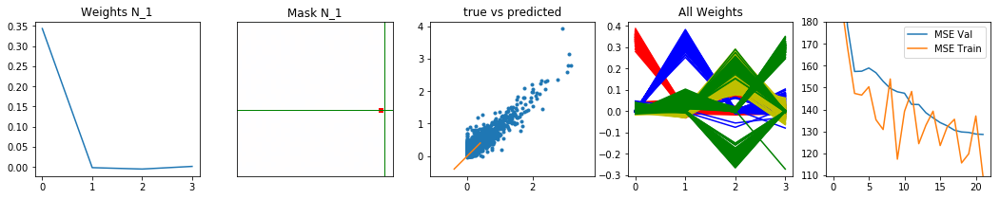

Runs: 2300; MSE - train: 132.882, val: 128.460913897; lr = 0.001
Loss: 0.0 mask Loss: 1.52815246582 weights
latest:  128.460913897
FEV =  0.648284290982
best:  22 128.460913897


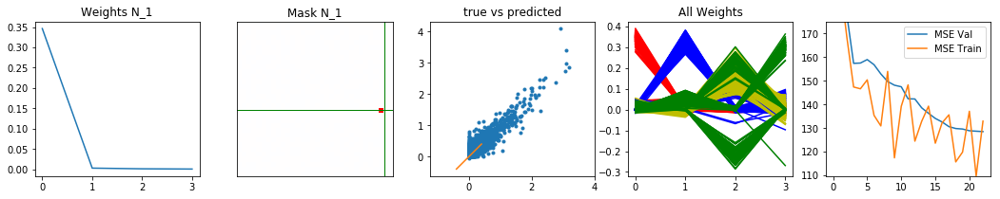

Runs: 2400; MSE - train: 121.375, val: 128.344850063; lr = 0.001
Loss: 0.0 mask Loss: 1.52311508179 weights
latest:  128.344850063
FEV =  0.650391093482
best:  23 128.344850063


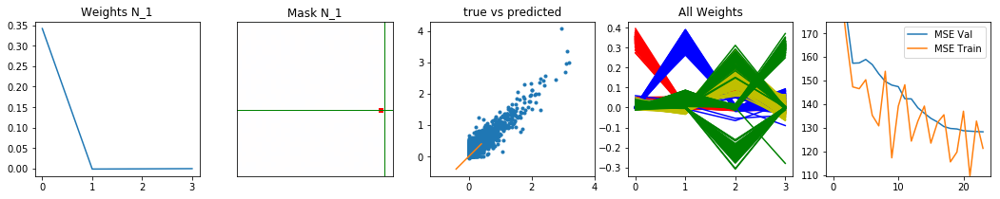

Runs: 2500; MSE - train: 118.619, val: 128.783502579; lr = 0.001
Loss: 0.0 mask Loss: 1.5258505249 weights
latest:  128.783502579
FEV =  0.644650779733
best:  23 128.344850063


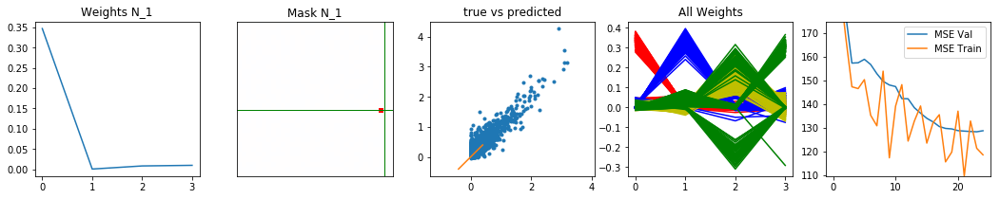

Runs: 2600; MSE - train: 123.45, val: 127.96177876; lr = 0.001
Loss: 0.0 mask Loss: 1.52797424316 weights
latest:  127.96177876
FEV =  0.65538940559
best:  25 127.96177876


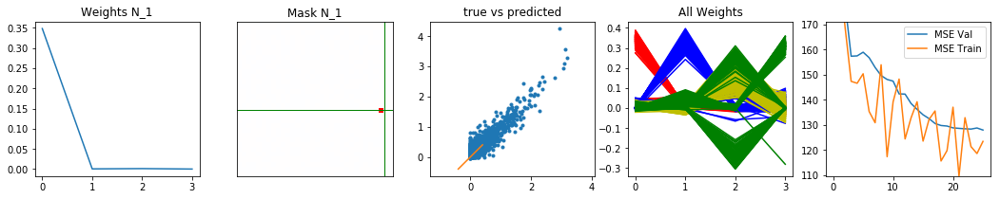

Runs: 2700; MSE - train: 145.696, val: 127.959328055; lr = 0.001
Loss: 0.0 mask Loss: 1.51612533569 weights
latest:  127.959328055
FEV =  0.655551559834
best:  26 127.959328055


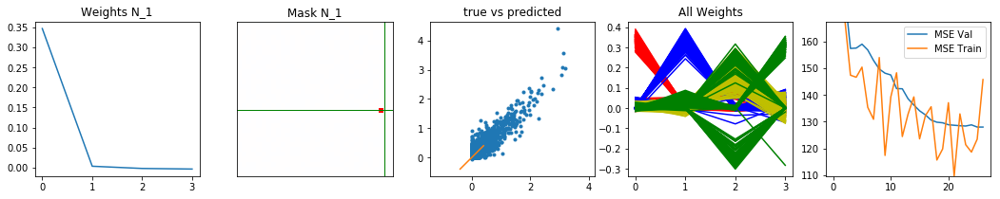

Runs: 2800; MSE - train: 108.636, val: 129.138400435; lr = 0.001
Loss: 0.0 mask Loss: 1.52054931641 weights
latest:  129.138400435
FEV =  0.642091293741
best:  26 127.959328055


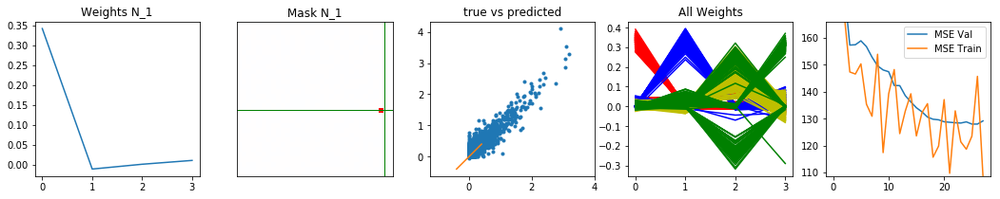

Runs: 2900; MSE - train: 136.744, val: 129.628500342; lr = 0.001
Loss: 0.0 mask Loss: 1.52640487671 weights
latest:  129.628500342
FEV =  0.635126851978
best:  26 127.959328055


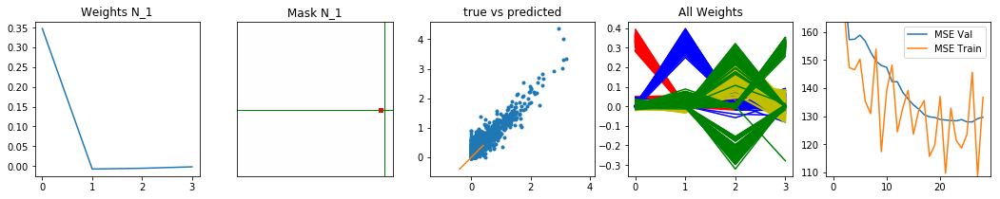

Runs: 3000; MSE - train: 123.34, val: 128.026522875; lr = 0.001
Loss: 0.0 mask Loss: 1.51201507568 weights
latest:  128.026522875
FEV =  0.65539016227
best:  26 127.959328055


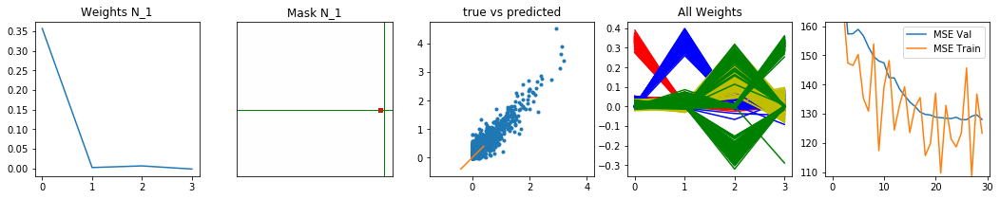

Runs: 3100; MSE - train: 114.492, val: 129.230829835; lr = 0.001
Loss: 0.0 mask Loss: 1.51274032593 weights
latest:  129.230829835
FEV =  0.640027423147
best:  26 127.959328055


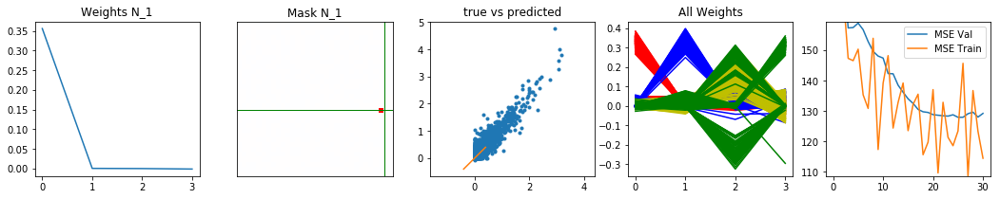

Runs: 3200; MSE - train: 161.912, val: 129.423144221; lr = 0.001
Loss: 0.0 mask Loss: 1.50630111694 weights
latest:  129.423144221
FEV =  0.638394299209
best:  26 127.959328055


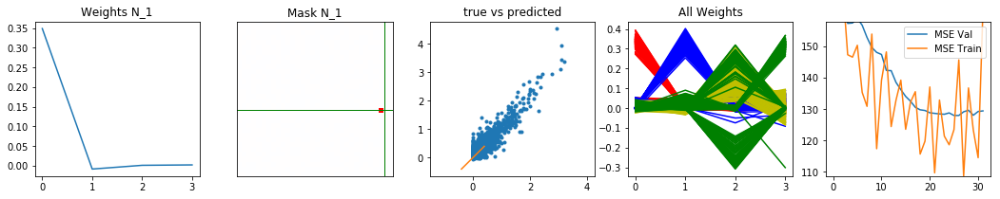

Runs: 3300; MSE - train: 133.021, val: 129.666862607; lr = 0.001
Loss: 0.0 mask Loss: 1.51106872559 weights
latest:  129.666862607
FEV =  0.634465859551
best:  26 127.959328055


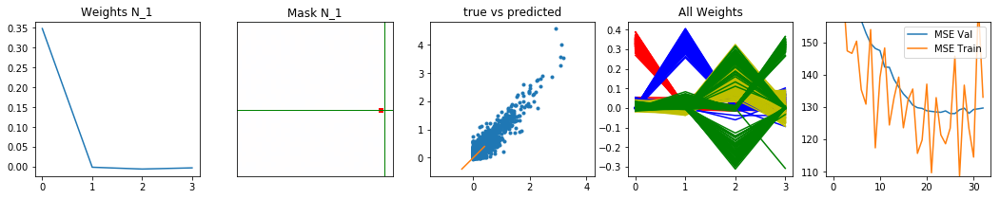

Runs: 3400; MSE - train: 135.263, val: 129.183668733; lr = 0.001
Loss: 0.0 mask Loss: 1.50751464844 weights
latest:  129.183668733
FEV =  0.641145987108
best:  26 127.959328055


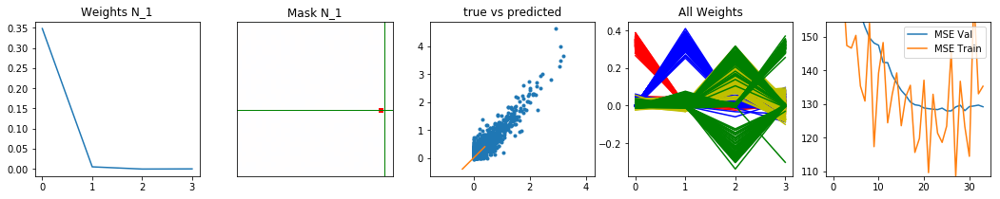

Runs: 3500; MSE - train: 114.786, val: 129.898300529; lr = 0.001
Loss: 0.0 mask Loss: 1.510128479 weights
latest:  129.898300529
FEV =  0.632354357157
best:  26 127.959328055


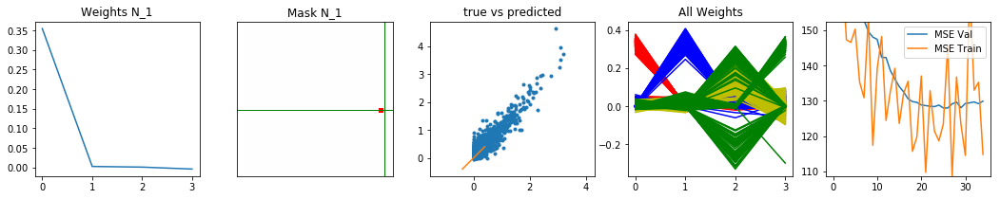

Runs: 3600; MSE - train: 113.769, val: 127.727145433; lr = 0.0001
Loss: 0.0 mask Loss: 1.5008807373 weights
latest:  127.727145433
FEV =  0.659572454901
best:  35 127.727145433


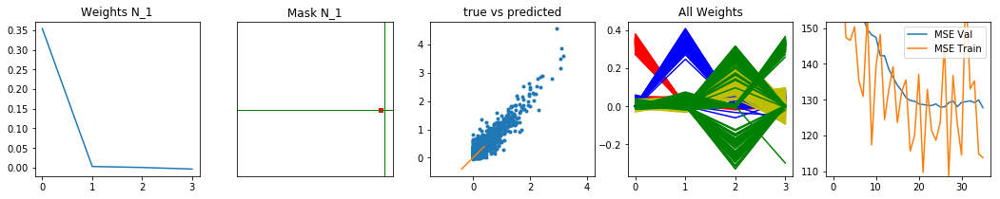

Runs: 3700; MSE - train: 134.289, val: 127.504073858; lr = 0.0001
Loss: 0.0 mask Loss: 1.49687652588 weights
latest:  127.504073858
FEV =  0.662267943203
best:  36 127.504073858


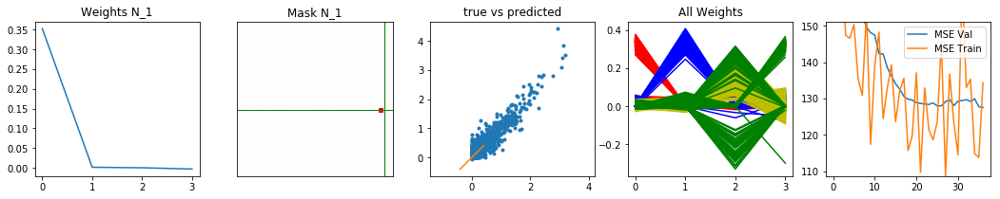

Runs: 3800; MSE - train: 129.168, val: 127.519110084; lr = 0.0001
Loss: 0.0 mask Loss: 1.49394821167 weights
latest:  127.519110084
FEV =  0.662103251118
best:  36 127.504073858


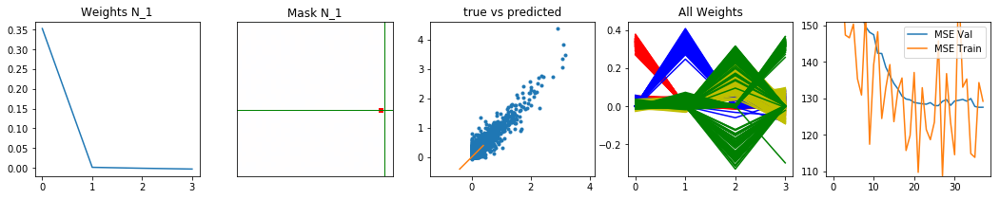

Runs: 3900; MSE - train: 131.386, val: 126.705862761; lr = 0.0001
Loss: 0.0 mask Loss: 1.49314163208 weights
latest:  126.705862761
FEV =  0.6720815072
best:  38 126.705862761


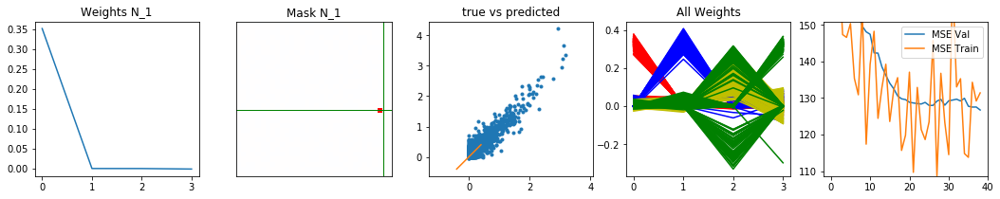

Runs: 4000; MSE - train: 118.251, val: 126.649280548; lr = 0.0001
Loss: 0.0 mask Loss: 1.49027252197 weights
latest:  126.649280548
FEV =  0.672696156276
best:  39 126.649280548


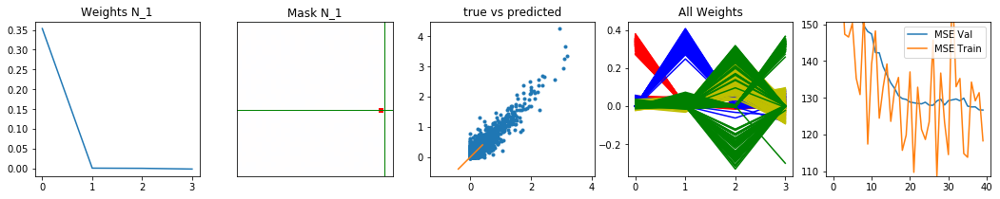

Runs: 4100; MSE - train: 131.386, val: 126.60413897; lr = 0.0001
Loss: 0.0 mask Loss: 1.49002380371 weights
latest:  126.60413897
FEV =  0.673142904269
best:  40 126.60413897


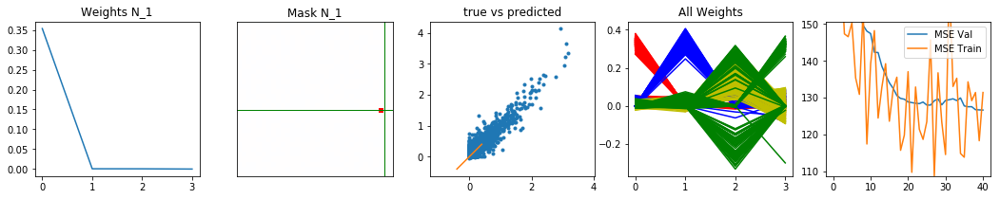

Runs: 4200; MSE - train: 127.036, val: 126.324427843; lr = 0.0001
Loss: 0.0 mask Loss: 1.48843078613 weights
latest:  126.324427843
FEV =  0.676533152751
best:  41 126.324427843


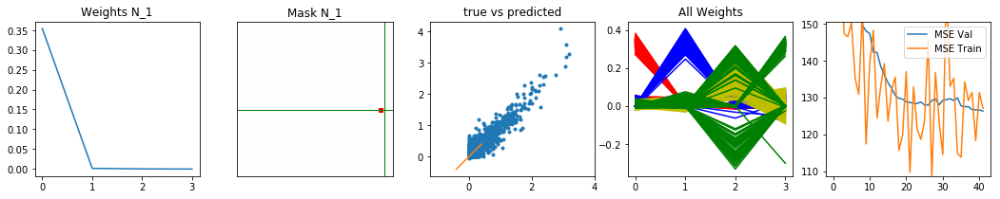

Runs: 4300; MSE - train: 139.642, val: 126.444515824; lr = 0.0001
Loss: 0.0 mask Loss: 1.48827133179 weights
latest:  126.444515824
FEV =  0.674916718668
best:  41 126.324427843


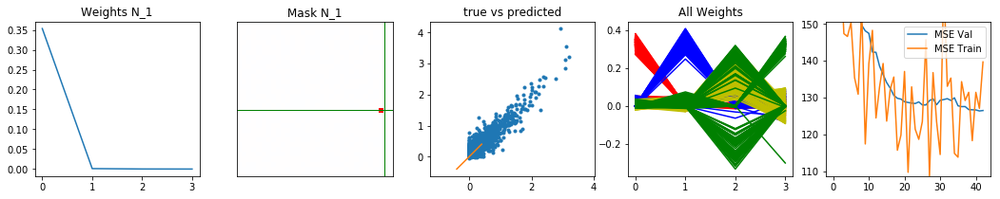

Runs: 4400; MSE - train: 118.916, val: 126.308328271; lr = 0.0001
Loss: 0.0 mask Loss: 1.48780517578 weights
latest:  126.308328271
FEV =  0.676699644376
best:  43 126.308328271


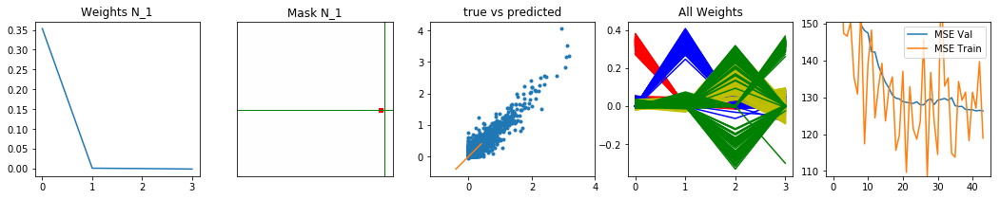

Runs: 4500; MSE - train: 124.924, val: 126.13035953; lr = 0.0001
Loss: 0.0 mask Loss: 1.48847290039 weights
latest:  126.13035953
FEV =  0.678747689527
best:  44 126.13035953


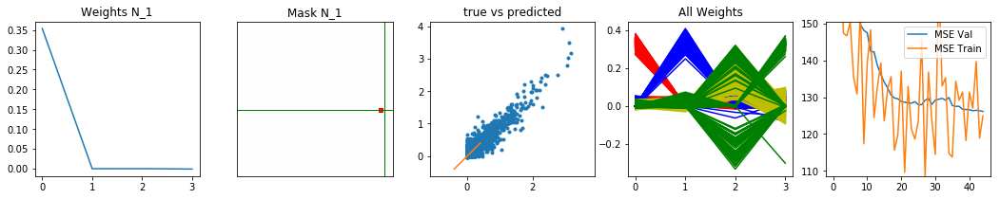

Runs: 4600; MSE - train: 132.904, val: 126.146234989; lr = 0.0001
Loss: 0.0 mask Loss: 1.4870489502 weights
latest:  126.146234989
FEV =  0.67849804144
best:  44 126.13035953


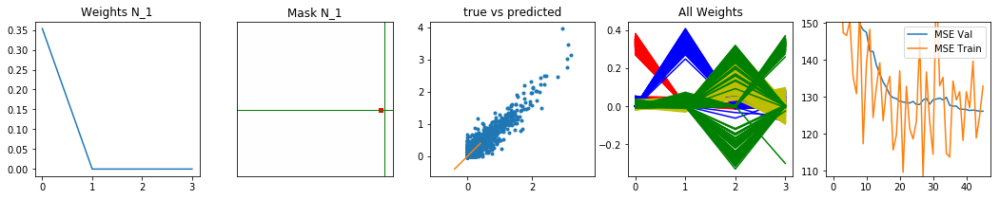

Runs: 4700; MSE - train: 94.5541, val: 126.127437234; lr = 0.0001
Loss: 0.0 mask Loss: 1.48723815918 weights
latest:  126.127437234
FEV =  0.678842024382
best:  46 126.127437234


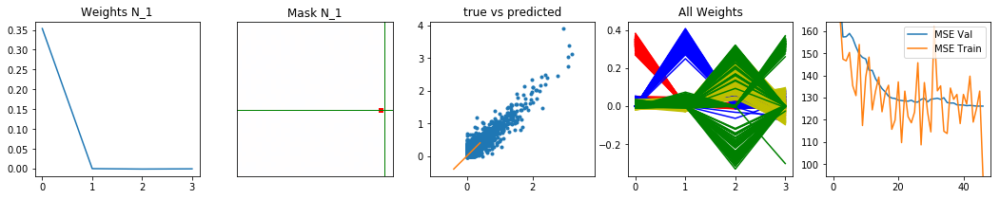

Runs: 4800; MSE - train: 127.002, val: 126.10023272; lr = 0.0001
Loss: 0.0 mask Loss: 1.4864125061 weights
latest:  126.10023272
FEV =  0.679117149671
best:  47 126.10023272


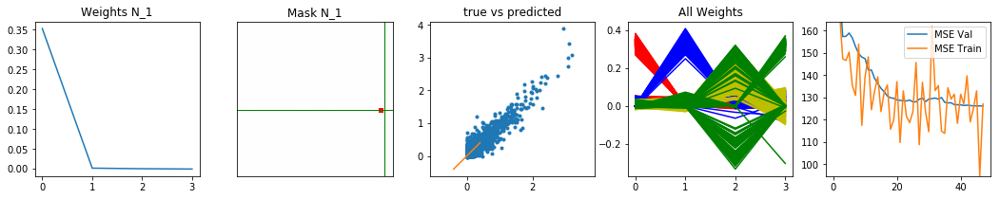

Runs: 4900; MSE - train: 137.977, val: 126.092483521; lr = 0.0001
Loss: 0.0 mask Loss: 1.48735336304 weights
latest:  126.092483521
FEV =  0.679290503754
best:  48 126.092483521


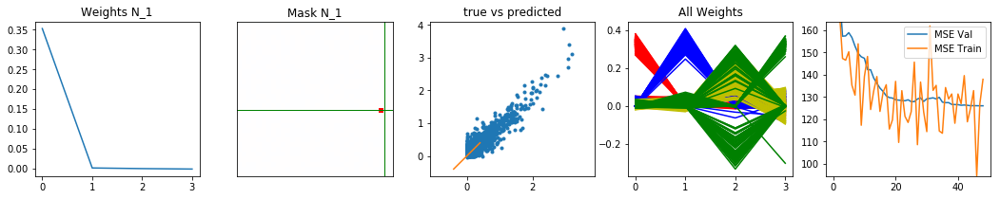

Runs: 5000; MSE - train: 135.997, val: 126.110943675; lr = 0.0001
Loss: 0.0 mask Loss: 1.48551879883 weights
latest:  126.110943675
FEV =  0.678896762953
best:  48 126.092483521


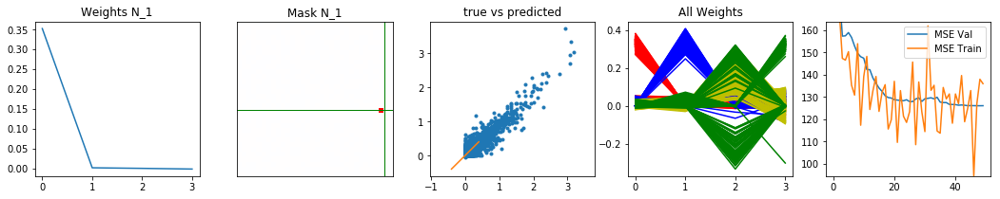

Runs: 5100; MSE - train: 138.561, val: 126.082131505; lr = 0.0001
Loss: 0.0 mask Loss: 1.4864440918 weights
latest:  126.082131505
FEV =  0.679224119607
best:  50 126.082131505


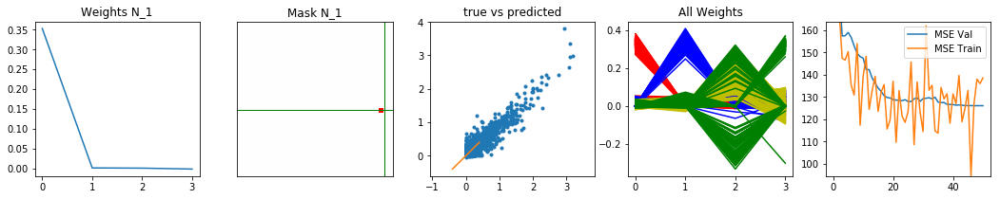

Runs: 5200; MSE - train: 132.544, val: 126.084070802; lr = 0.0001
Loss: 0.0 mask Loss: 1.48612976074 weights
latest:  126.084070802
FEV =  0.679391518279
best:  50 126.082131505


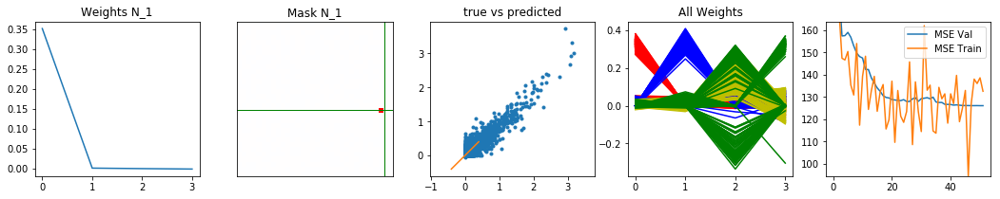

Runs: 5300; MSE - train: 121.329, val: 126.041342139; lr = 0.0001
Loss: 0.0 mask Loss: 1.48538848877 weights
latest:  126.041342139
FEV =  0.679670211249
best:  52 126.041342139


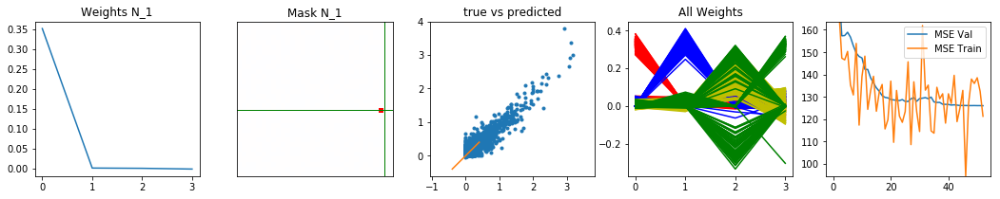

Runs: 5400; MSE - train: 123.342, val: 126.047868967; lr = 0.0001
Loss: 0.0 mask Loss: 1.48463409424 weights
latest:  126.047868967
FEV =  0.679691745748
best:  52 126.041342139


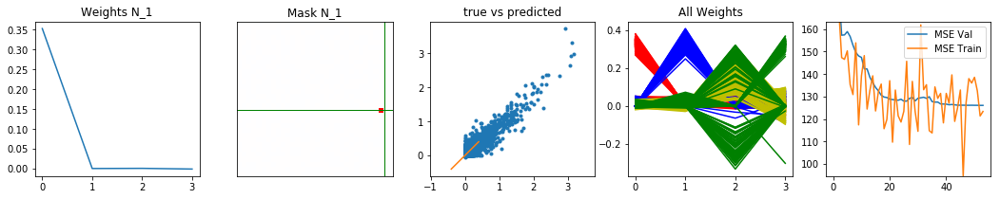

Runs: 5500; MSE - train: 143.239, val: 126.074046373; lr = 0.0001
Loss: 0.0 mask Loss: 1.48398696899 weights
latest:  126.074046373
FEV =  0.679444197423
best:  52 126.041342139


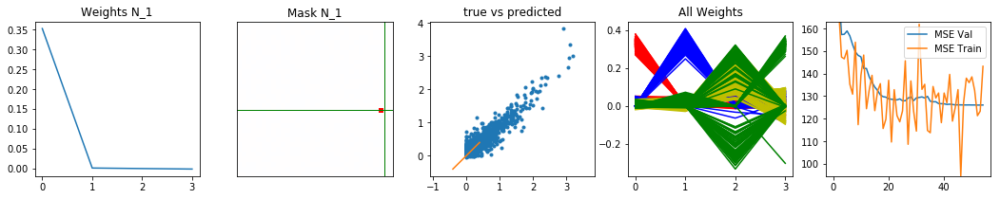

Runs: 5600; MSE - train: 150.311, val: 126.072978854; lr = 0.0001
Loss: 0.0 mask Loss: 1.48433303833 weights
latest:  126.072978854
FEV =  0.679262483861
best:  52 126.041342139


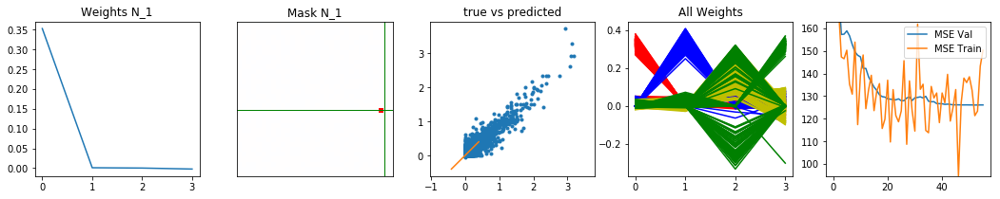

Runs: 5700; MSE - train: 142.805, val: 126.093811989; lr = 0.0001
Loss: 0.0 mask Loss: 1.48382415771 weights
latest:  126.093811989
FEV =  0.679153755485
best:  52 126.041342139


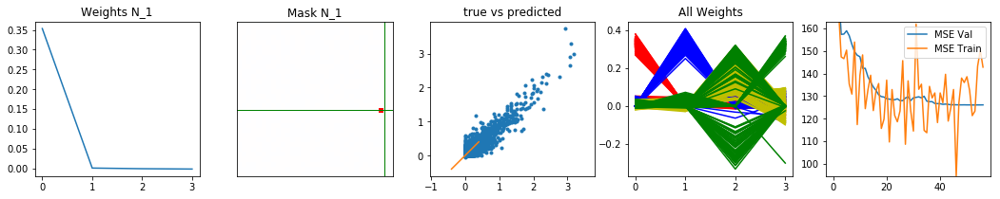

Runs: 5800; MSE - train: 139.665, val: 126.11265552; lr = 0.0001
Loss: 0.0 mask Loss: 1.48282958984 weights
latest:  126.11265552
FEV =  0.678735379941
best:  52 126.041342139


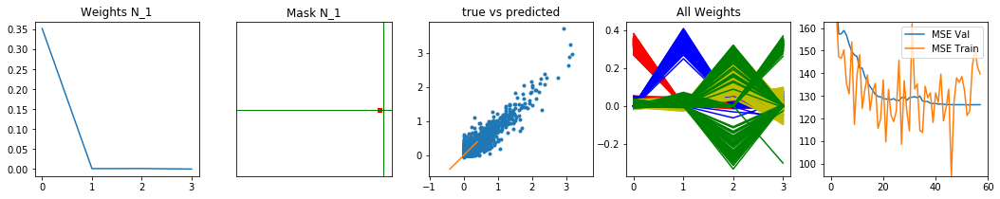

Runs: 5900; MSE - train: 117.465, val: 126.099922299; lr = 0.0001
Loss: 0.0 mask Loss: 1.48247207642 weights
latest:  126.099922299
FEV =  0.678835766707
best:  52 126.041342139


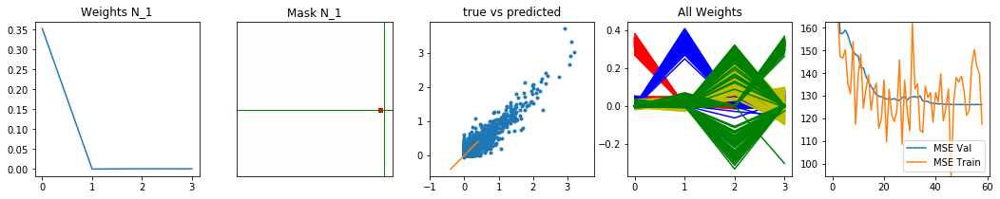

Runs: 6000; MSE - train: 126.851, val: 126.039008856; lr = 0.0001
Loss: 0.0 mask Loss: 1.48301940918 weights
latest:  126.039008856
FEV =  0.679969687909
best:  59 126.039008856


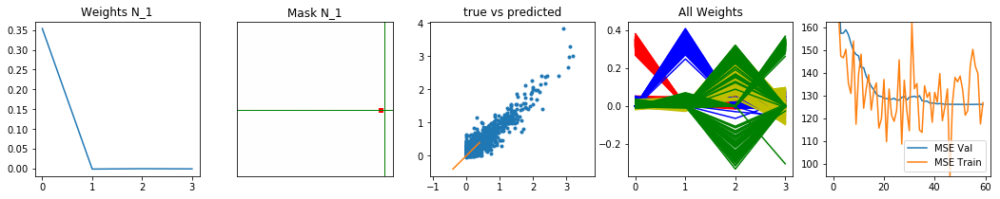

Runs: 6100; MSE - train: 129.997, val: 126.029835224; lr = 0.0001
Loss: 0.0 mask Loss: 1.48286605835 weights
latest:  126.029835224
FEV =  0.679662892843
best:  60 126.029835224


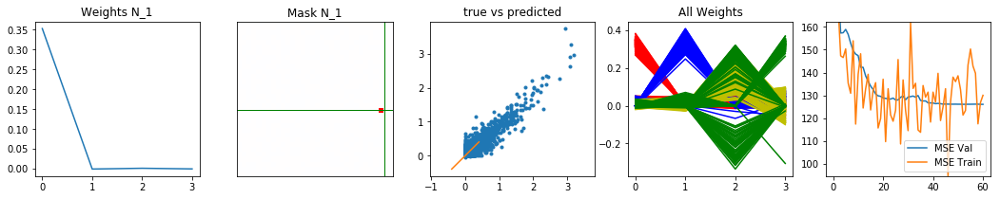

Runs: 6200; MSE - train: 124.924, val: 125.995165825; lr = 0.0001
Loss: 0.0 mask Loss: 1.48268157959 weights
latest:  125.995165825
FEV =  0.680369619753
best:  61 125.995165825


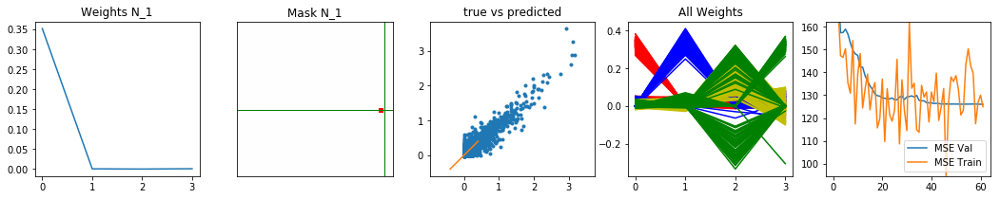

Runs: 6300; MSE - train: 125.13, val: 125.980431437; lr = 0.0001
Loss: 0.0 mask Loss: 1.48131408691 weights
latest:  125.980431437
FEV =  0.680304343056
best:  62 125.980431437


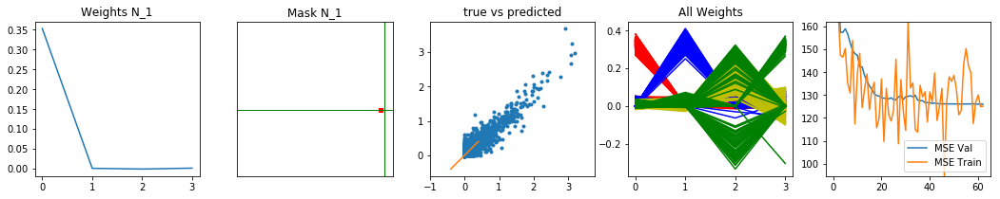

Runs: 6400; MSE - train: 138.488, val: 126.061847091; lr = 0.0001
Loss: 0.0 mask Loss: 1.48127059937 weights
latest:  126.061847091
FEV =  0.679334580638
best:  62 125.980431437


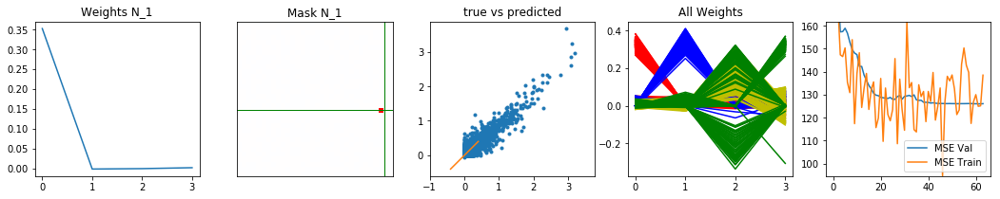

Runs: 6500; MSE - train: 147.57, val: 125.94720757; lr = 0.0001
Loss: 0.0 mask Loss: 1.480912323 weights
latest:  125.94720757
FEV =  0.681018228816
best:  64 125.94720757


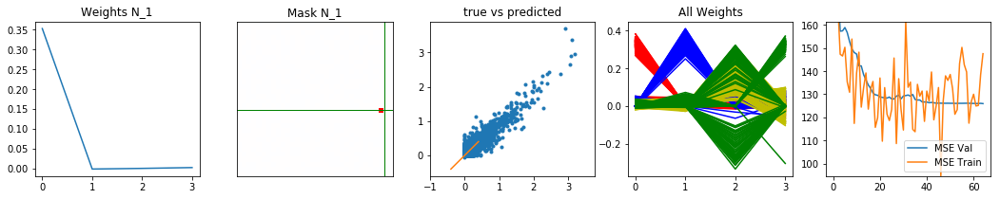

Runs: 6600; MSE - train: 126.702, val: 125.917079926; lr = 0.0001
Loss: 0.0 mask Loss: 1.48199462891 weights
latest:  125.917079926
FEV =  0.681225755287
best:  65 125.917079926


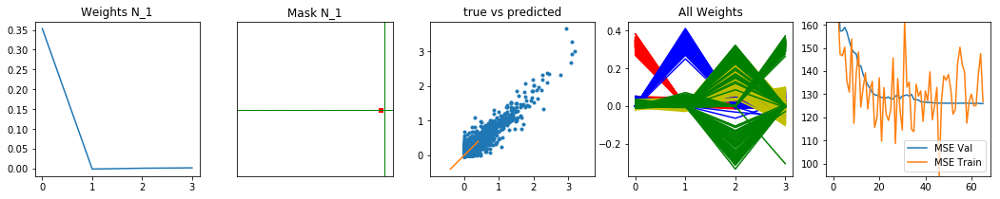

Runs: 6700; MSE - train: 115.656, val: 126.018119693; lr = 0.0001
Loss: 0.0 mask Loss: 1.48052108765 weights
latest:  126.018119693
FEV =  0.680103328018
best:  65 125.917079926


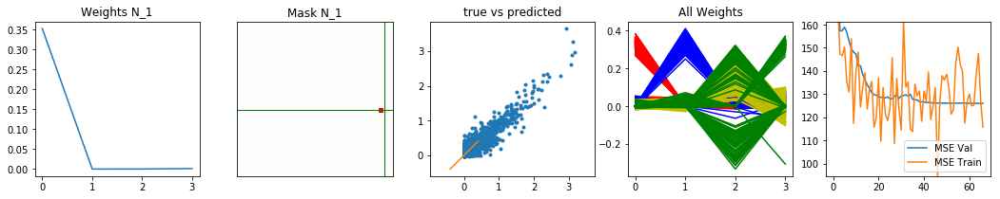

Runs: 6800; MSE - train: 143.712, val: 125.947661161; lr = 0.0001
Loss: 0.0 mask Loss: 1.48131271362 weights
latest:  125.947661161
FEV =  0.680610097559
best:  65 125.917079926


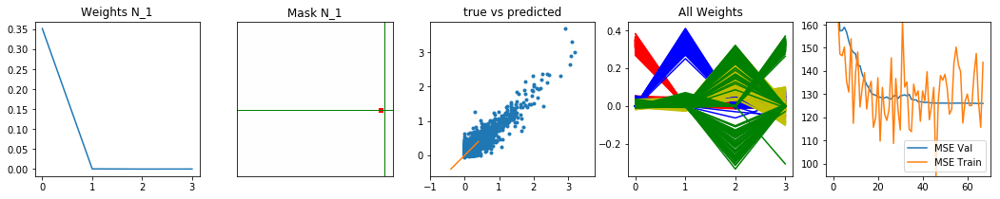

Runs: 6900; MSE - train: 121.881, val: 125.976638675; lr = 0.0001
Loss: 0.0 mask Loss: 1.48092086792 weights
latest:  125.976638675
FEV =  0.680428395995
best:  65 125.917079926


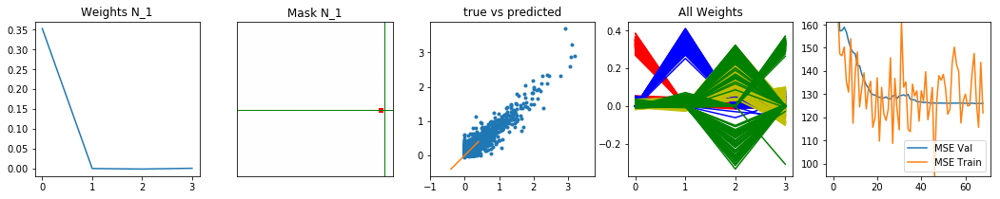

Runs: 7000; MSE - train: 140.276, val: 126.063063264; lr = 0.0001
Loss: 0.0 mask Loss: 1.47975570679 weights
latest:  126.063063264
FEV =  0.679518939007
best:  65 125.917079926


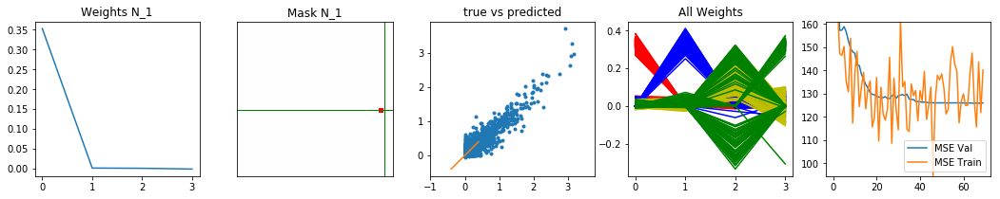

Runs: 7100; MSE - train: 148.669, val: 125.937515259; lr = 0.0001
Loss: 0.0 mask Loss: 1.47935043335 weights
latest:  125.937515259
FEV =  0.681192728897
best:  65 125.917079926


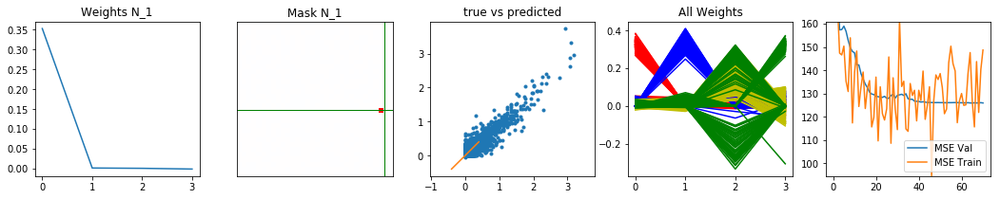

Runs: 7200; MSE - train: 138.582, val: 125.942968249; lr = 0.0001
Loss: 0.0 mask Loss: 1.47861831665 weights
latest:  125.942968249
FEV =  0.680995035441
best:  65 125.917079926


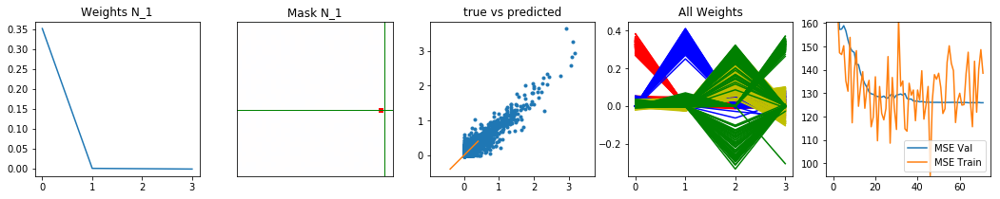

Runs: 7300; MSE - train: 136.003, val: 125.960429311; lr = 0.0001
Loss: 0.0 mask Loss: 1.47817565918 weights
latest:  125.960429311
FEV =  0.680725939087
best:  65 125.917079926


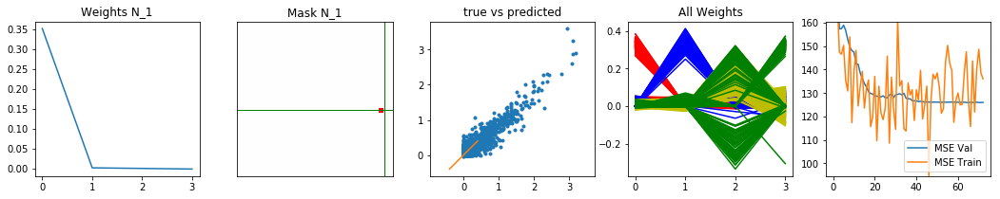

Runs: 7400; MSE - train: 112.965, val: 125.988193154; lr = 0.0001
Loss: 0.0 mask Loss: 1.47943878174 weights
latest:  125.988193154
FEV =  0.680456235653
best:  65 125.917079926


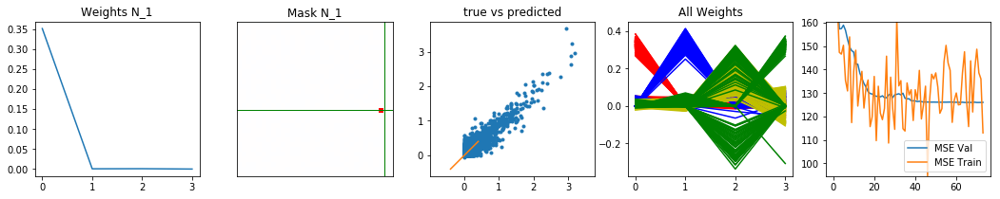

Runs: 7500; MSE - train: 139.972, val: 125.844809651; lr = 1e-05
Loss: 0.0 mask Loss: 1.47866516113 weights
latest:  125.844809651
FEV =  0.68234286639
best:  74 125.844809651


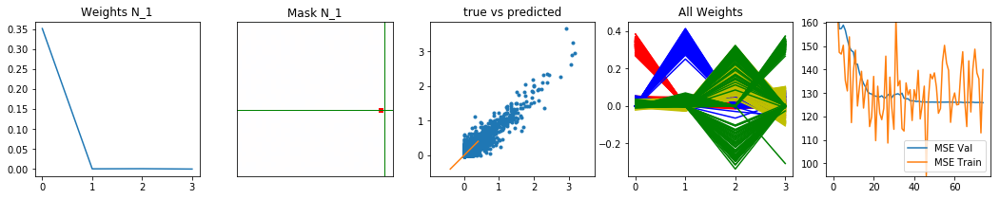

Runs: 7600; MSE - train: 147.582, val: 125.824327946; lr = 1e-05
Loss: 0.0 mask Loss: 1.47820922852 weights
latest:  125.824327946
FEV =  0.682577851371
best:  75 125.824327946


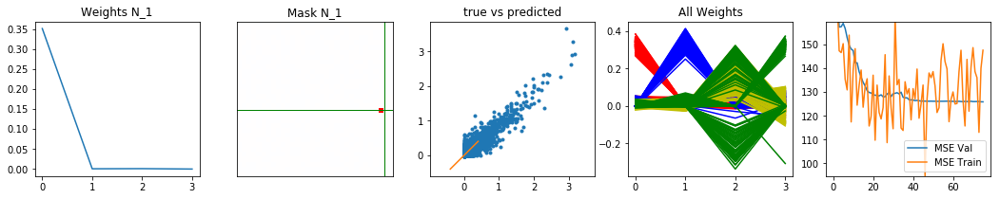

Runs: 7700; MSE - train: 110.832, val: 125.819288015; lr = 1e-05
Loss: 0.0 mask Loss: 1.47787826538 weights
latest:  125.819288015
FEV =  0.682633754065
best:  76 125.819288015


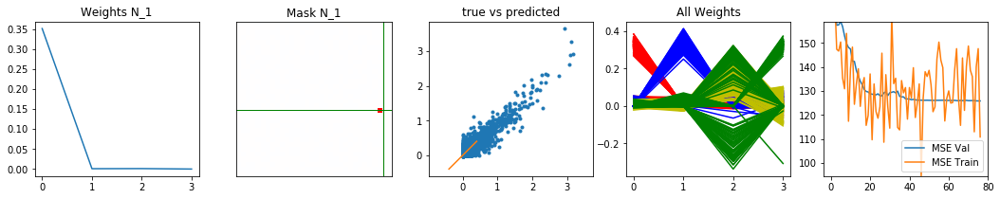

Runs: 7800; MSE - train: 121.071, val: 125.81907928; lr = 1e-05
Loss: 0.0 mask Loss: 1.47762374878 weights
latest:  125.81907928
FEV =  0.682596600142
best:  77 125.81907928


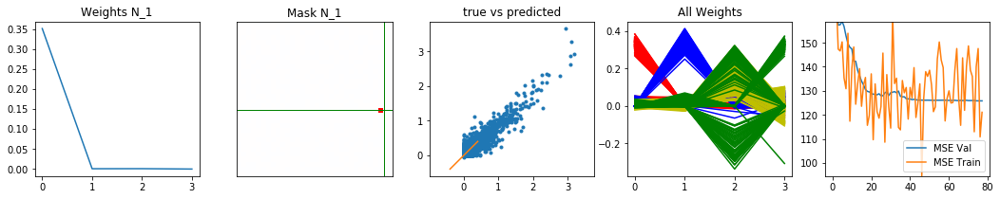

Runs: 7900; MSE - train: 121.466, val: 125.820587158; lr = 1e-05
Loss: 0.0 mask Loss: 1.47738113403 weights
latest:  125.820587158
FEV =  0.68254890937
best:  77 125.81907928


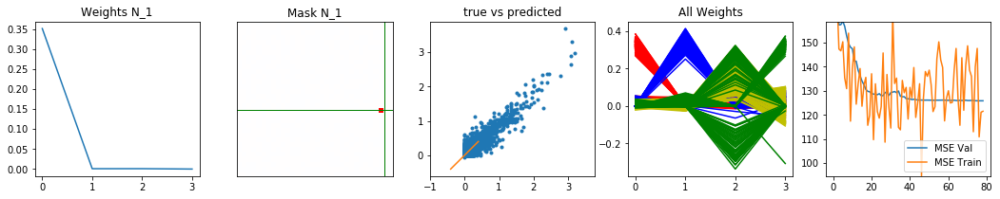

Runs: 8000; MSE - train: 113.378, val: 125.803053975; lr = 1e-05
Loss: 0.0 mask Loss: 1.4770475769 weights
latest:  125.803053975
FEV =  0.682739602256
best:  79 125.803053975


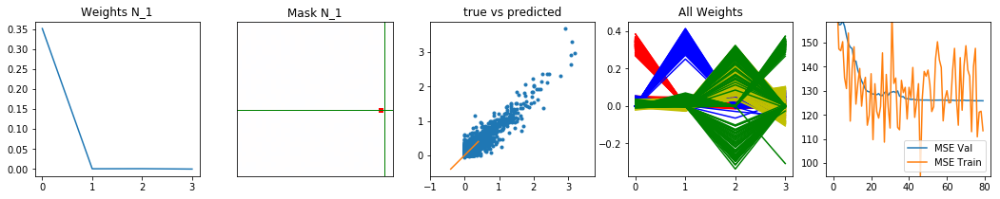

Runs: 8100; MSE - train: 118.34, val: 125.806185842; lr = 1e-05
Loss: 0.0 mask Loss: 1.47687255859 weights
latest:  125.806185842
FEV =  0.682802066166
best:  79 125.803053975


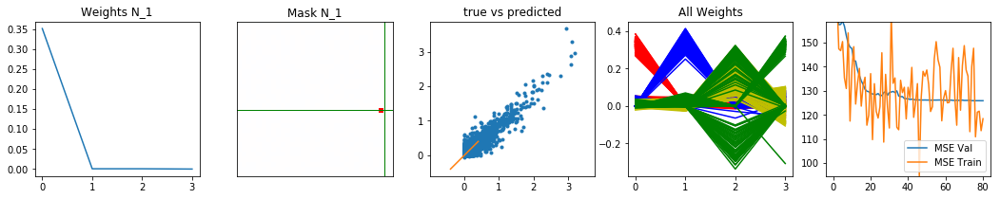

Runs: 8200; MSE - train: 131.819, val: 125.808888078; lr = 1e-05
Loss: 0.0 mask Loss: 1.47670059204 weights
latest:  125.808888078
FEV =  0.682628355187
best:  79 125.803053975


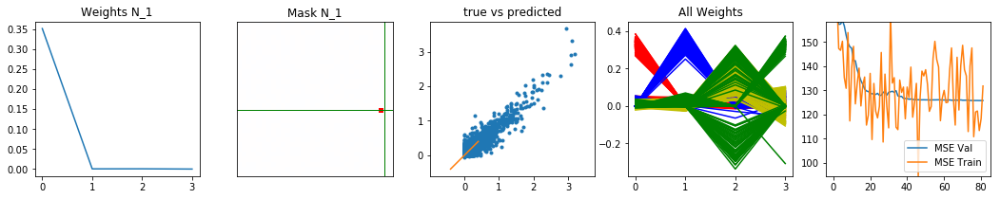

Runs: 8300; MSE - train: 112.894, val: 125.793421626; lr = 1e-05
Loss: 0.0 mask Loss: 1.47661697388 weights
latest:  125.793421626
FEV =  0.68296935251
best:  82 125.793421626


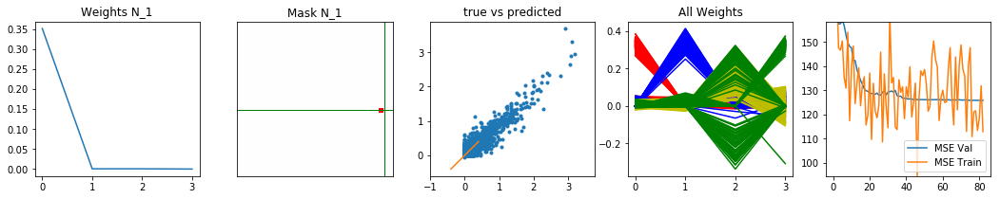

Runs: 8400; MSE - train: 134.306, val: 125.791977048; lr = 1e-05
Loss: 0.0 mask Loss: 1.4763053894 weights
latest:  125.791977048
FEV =  0.682965100395
best:  83 125.791977048


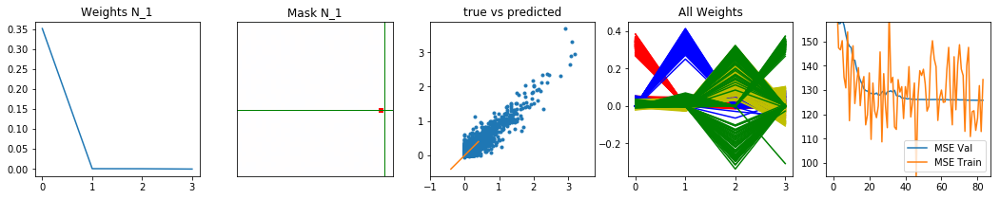

Runs: 8500; MSE - train: 132.73, val: 125.792196989; lr = 1e-05
Loss: 0.0 mask Loss: 1.47633163452 weights
latest:  125.792196989
FEV =  0.682846613294
best:  83 125.791977048


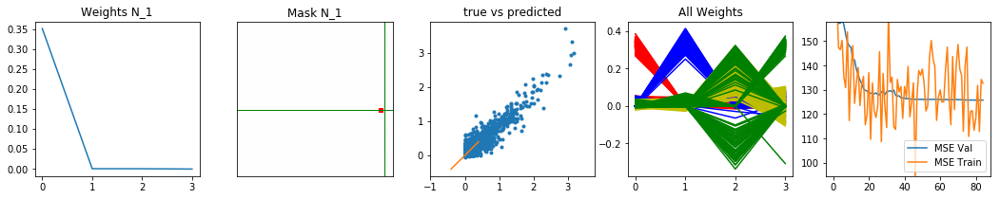

Runs: 8600; MSE - train: 139.811, val: 125.792728424; lr = 1e-05
Loss: 0.0 mask Loss: 1.47622451782 weights
latest:  125.792728424
FEV =  0.682910562227
best:  83 125.791977048


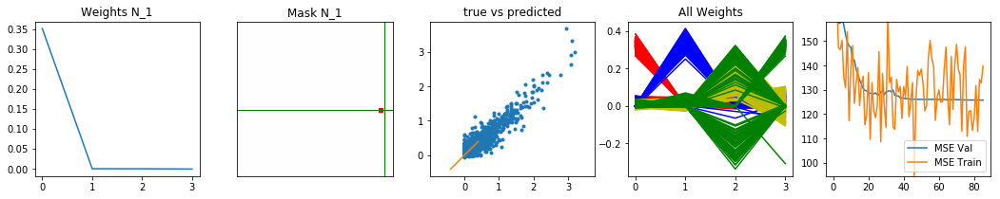

Runs: 8700; MSE - train: 111.686, val: 125.792791247; lr = 1e-05
Loss: 0.0 mask Loss: 1.47602828979 weights
latest:  125.792791247
FEV =  0.682954569417
best:  83 125.791977048


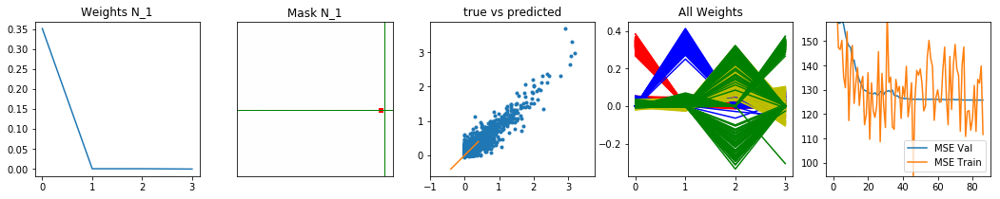

Runs: 8800; MSE - train: 123.36, val: 125.797584772; lr = 1e-05
Loss: 0.0 mask Loss: 1.47604263306 weights
latest:  125.797584772
FEV =  0.682800405247
best:  83 125.791977048


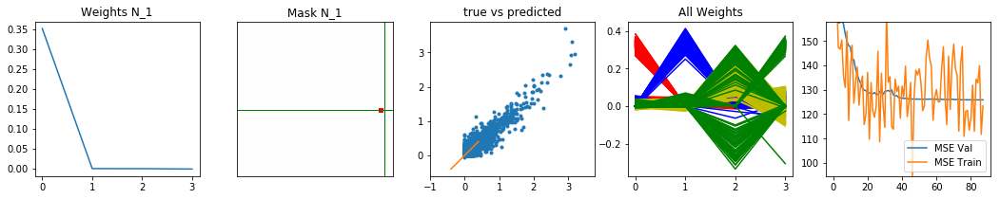

Runs: 8900; MSE - train: 114.933, val: 125.789468288; lr = 1e-05
Loss: 0.0 mask Loss: 1.47595840454 weights
latest:  125.789468288
FEV =  0.68303309236
best:  88 125.789468288


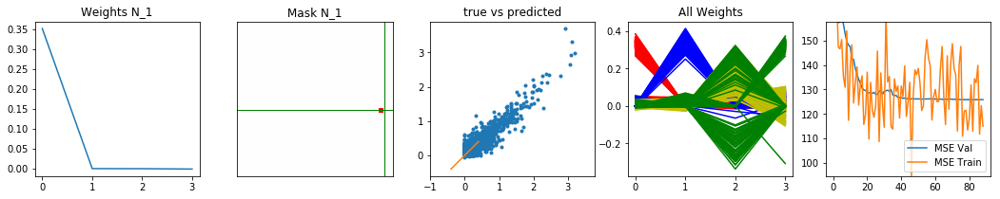

Runs: 9000; MSE - train: 144.63, val: 125.775048971; lr = 1e-05
Loss: 0.0 mask Loss: 1.47589874268 weights
latest:  125.775048971
FEV =  0.683167946119
best:  89 125.775048971


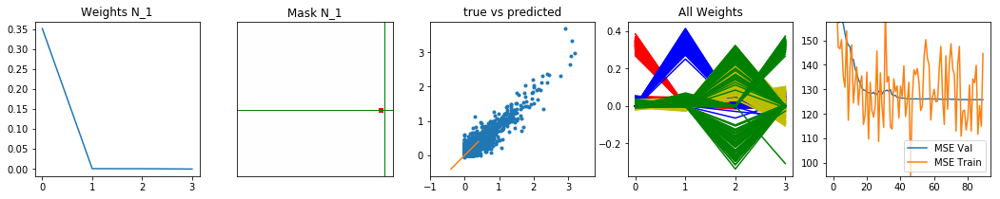

Runs: 9100; MSE - train: 123.688, val: 125.783748507; lr = 1e-05
Loss: 0.0 mask Loss: 1.47575592041 weights
latest:  125.783748507
FEV =  0.683047203018
best:  89 125.775048971


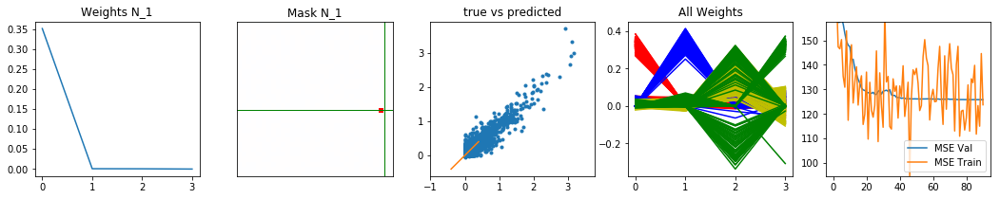

Runs: 9200; MSE - train: 143.029, val: 125.761414766; lr = 1e-05
Loss: 0.0 mask Loss: 1.47574020386 weights
latest:  125.761414766
FEV =  0.683254505599
best:  91 125.761414766


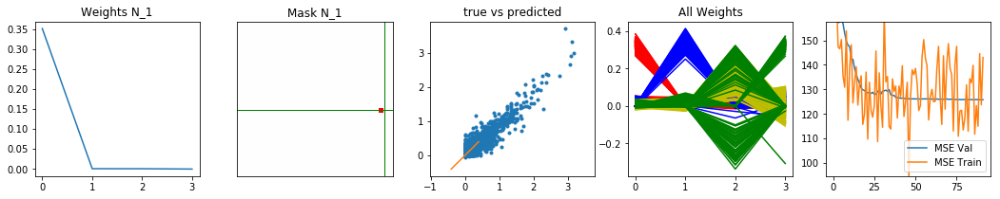

Runs: 9300; MSE - train: 152.38, val: 125.774950147; lr = 1e-05
Loss: 0.0 mask Loss: 1.47569030762 weights
latest:  125.774950147
FEV =  0.683117359589
best:  91 125.761414766


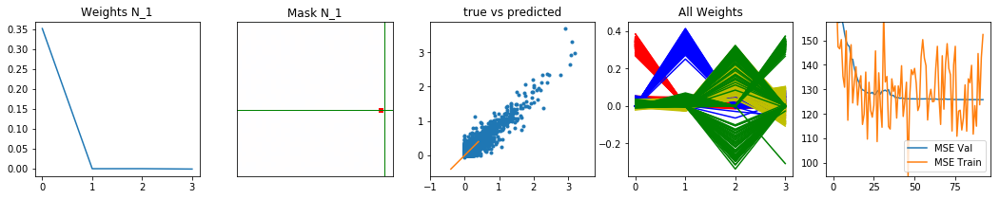

Runs: 9400; MSE - train: 116.149, val: 125.765067935; lr = 1e-05
Loss: 0.0 mask Loss: 1.47568527222 weights
latest:  125.765067935
FEV =  0.683344182174
best:  91 125.761414766


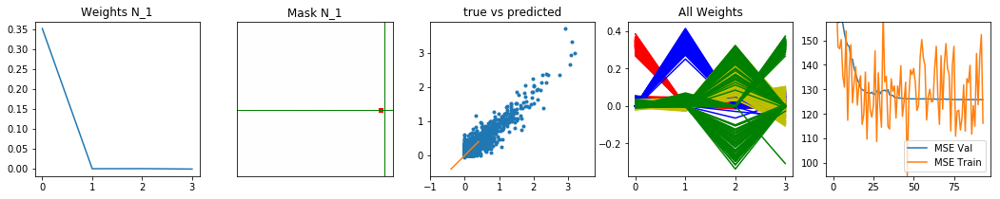

Runs: 9500; MSE - train: 143.356, val: 125.784742951; lr = 1e-05
Loss: 0.0 mask Loss: 1.47551330566 weights
latest:  125.784742951
FEV =  0.683078372427
best:  91 125.761414766


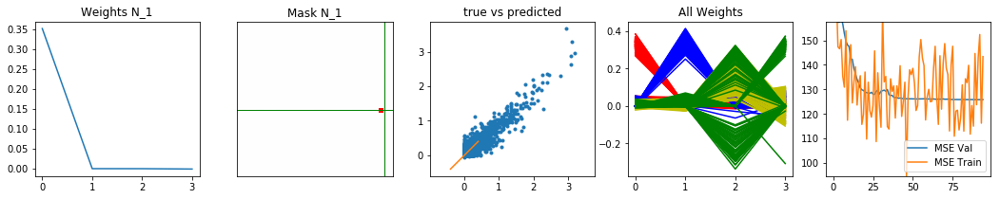

Runs: 9600; MSE - train: 132.009, val: 125.772085905; lr = 1e-05
Loss: 0.0 mask Loss: 1.47543701172 weights
latest:  125.772085905
FEV =  0.683234829103
best:  91 125.761414766


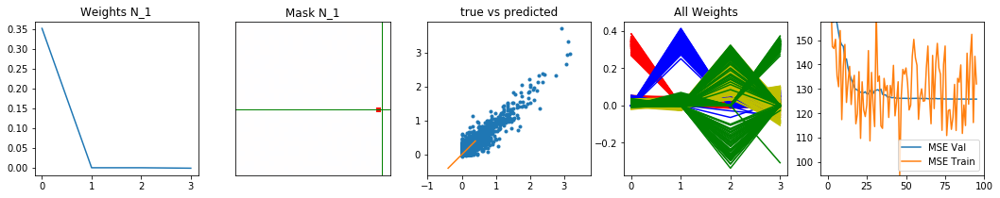

Runs: 9700; MSE - train: 122.378, val: 125.775921941; lr = 1e-05
Loss: 0.0 mask Loss: 1.47546920776 weights
latest:  125.775921941
FEV =  0.683195175633
best:  91 125.761414766


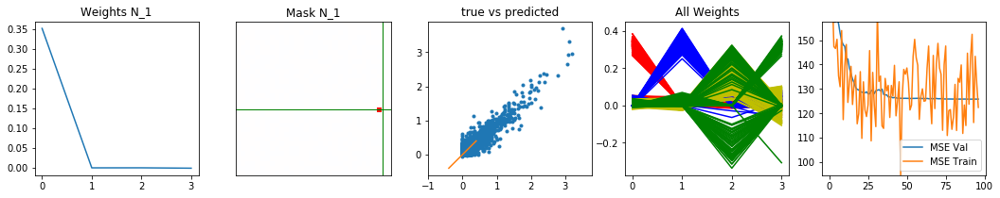

Runs: 9800; MSE - train: 123.858, val: 125.766545057; lr = 1e-05
Loss: 0.0 mask Loss: 1.47550842285 weights
latest:  125.766545057
FEV =  0.683291722579
best:  91 125.761414766


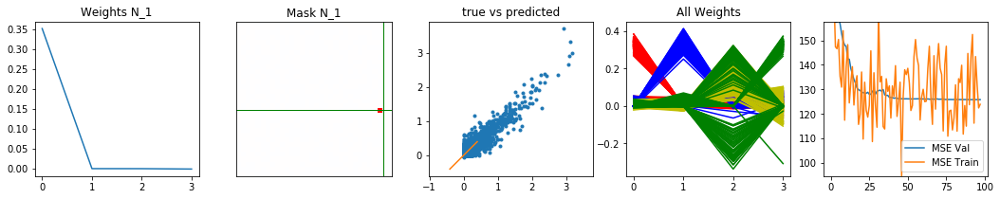

Runs: 9900; MSE - train: 123.06, val: 125.763101816; lr = 1e-05
Loss: 0.0 mask Loss: 1.4754927063 weights
latest:  125.763101816
FEV =  0.683339512404
best:  91 125.761414766


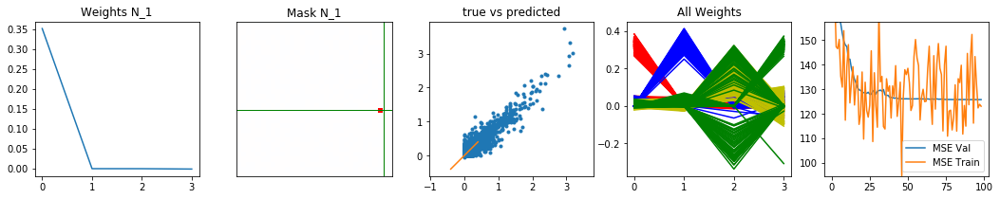

Runs: 10000; MSE - train: 135.721, val: 125.760304332; lr = 1e-05
Loss: 0.0 mask Loss: 1.47542984009 weights
latest:  125.760304332
FEV =  0.683368931543
best:  99 125.760304332


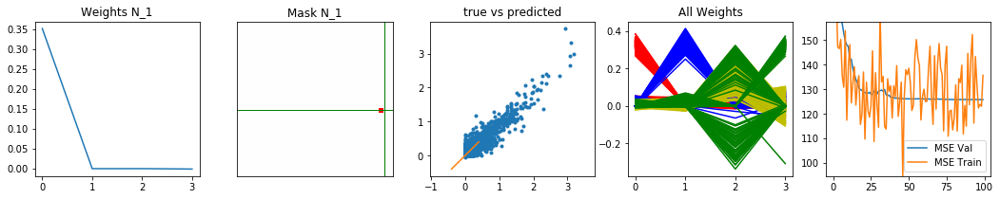

Runs: 10100; MSE - train: 113.274, val: 125.758178353; lr = 1e-05
Loss: 0.0 mask Loss: 1.47549926758 weights
latest:  125.758178353
FEV =  0.683410857096
best:  100 125.758178353


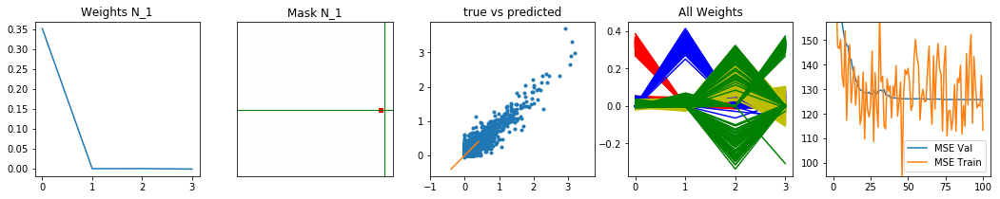

Runs: 10200; MSE - train: 115.066, val: 125.758668542; lr = 1e-05
Loss: 0.0 mask Loss: 1.47537872314 weights
latest:  125.758668542
FEV =  0.68333629396
best:  100 125.758178353


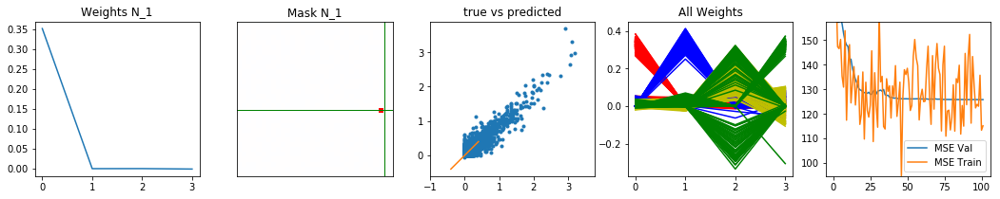

Runs: 10300; MSE - train: 119.492, val: 125.755389094; lr = 1e-05
Loss: 0.0 mask Loss: 1.47518493652 weights
latest:  125.755389094
FEV =  0.683351414802
best:  102 125.755389094


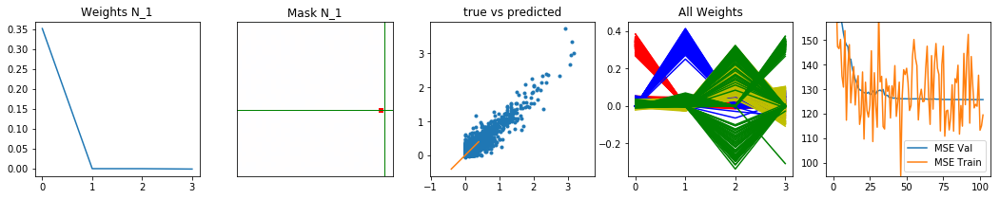

Runs: 10400; MSE - train: 120.628, val: 125.763424993; lr = 1e-05
Loss: 0.0 mask Loss: 1.47511383057 weights
latest:  125.763424993
FEV =  0.683279628714
best:  102 125.755389094


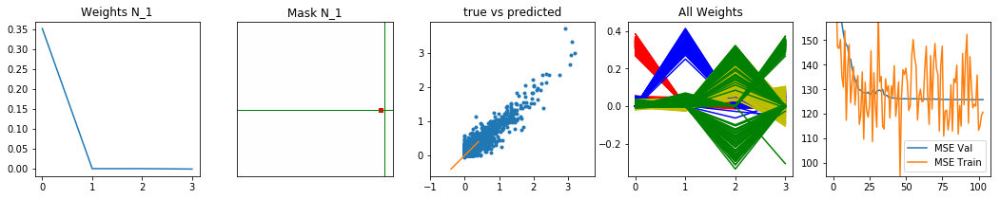

Runs: 10500; MSE - train: 125.85, val: 125.764892817; lr = 1e-05
Loss: 0.0 mask Loss: 1.47494094849 weights
latest:  125.764892817
FEV =  0.68329843033
best:  102 125.755389094


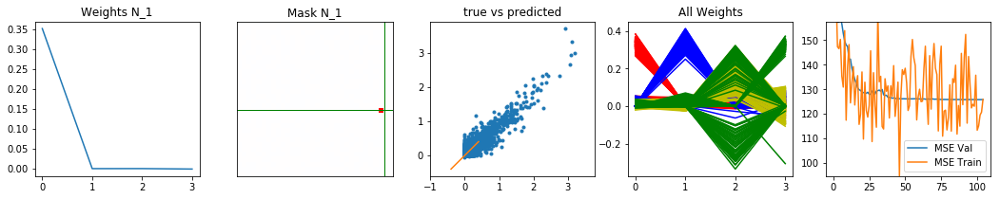

Runs: 10600; MSE - train: 111.846, val: 125.744575143; lr = 1e-05
Loss: 0.0 mask Loss: 1.47503875732 weights
latest:  125.744575143
FEV =  0.6835585734
best:  105 125.744575143


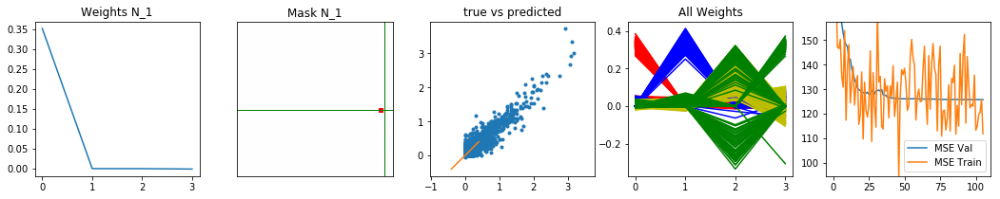

Runs: 10700; MSE - train: 141.975, val: 125.761350989; lr = 1e-05
Loss: 0.0 mask Loss: 1.47510040283 weights
latest:  125.761350989
FEV =  0.68338423696
best:  105 125.744575143


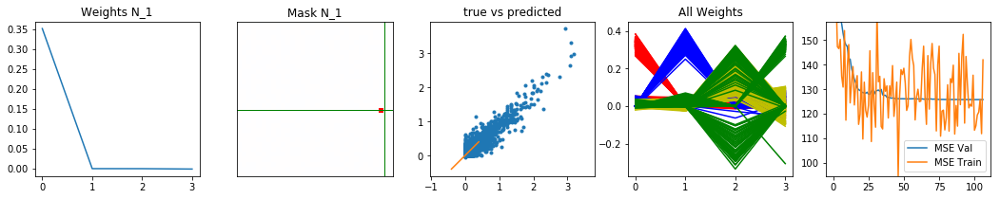

Runs: 10800; MSE - train: 119.267, val: 125.752233982; lr = 1e-05
Loss: 0.0 mask Loss: 1.47496414185 weights
latest:  125.752233982
FEV =  0.683459760498
best:  105 125.744575143


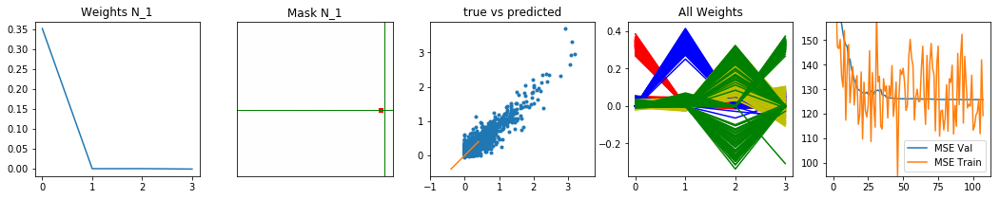

Runs: 10900; MSE - train: 121.752, val: 125.75029242; lr = 1e-05
Loss: 0.0 mask Loss: 1.47489593506 weights
latest:  125.75029242
FEV =  0.683463185472
best:  105 125.744575143


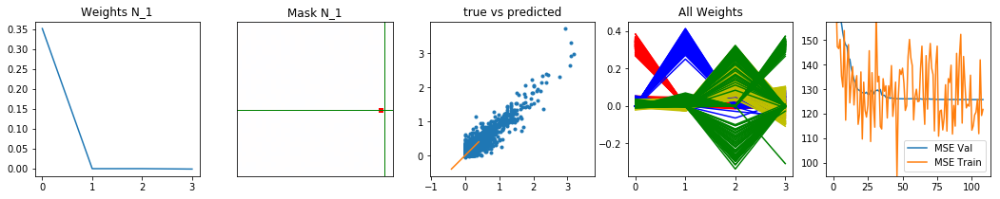

Runs: 11000; MSE - train: 139.027, val: 125.753921747; lr = 1e-05
Loss: 0.0 mask Loss: 1.4749067688 weights
latest:  125.753921747
FEV =  0.683479108946
best:  105 125.744575143


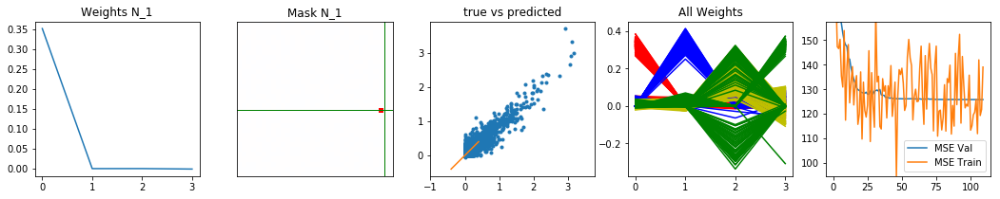

Runs: 11100; MSE - train: 113.491, val: 125.750671148; lr = 1e-05
Loss: 0.0 mask Loss: 1.47497634888 weights
latest:  125.750671148
FEV =  0.683513824592
best:  105 125.744575143


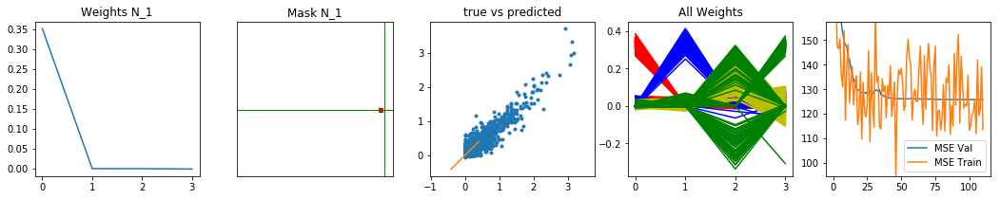

Runs: 11200; MSE - train: 124.428, val: 125.757264972; lr = 1e-05
Loss: 0.0 mask Loss: 1.47489334106 weights
latest:  125.757264972
FEV =  0.683425542413
best:  105 125.744575143


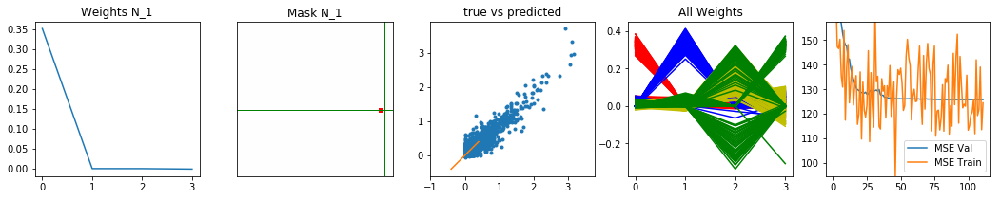

Runs: 11300; MSE - train: 129.556, val: 125.736962795; lr = 1e-05
Loss: 0.0 mask Loss: 1.47494033813 weights
latest:  125.736962795
FEV =  0.683614724492
best:  112 125.736962795


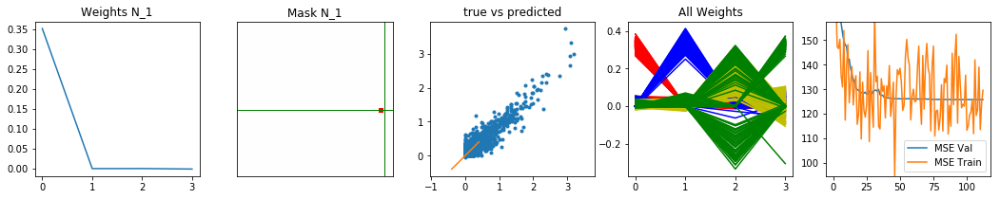

Runs: 11400; MSE - train: 134.311, val: 125.746508121; lr = 1e-05
Loss: 0.0 mask Loss: 1.47475891113 weights
latest:  125.746508121
FEV =  0.68358124394
best:  112 125.736962795


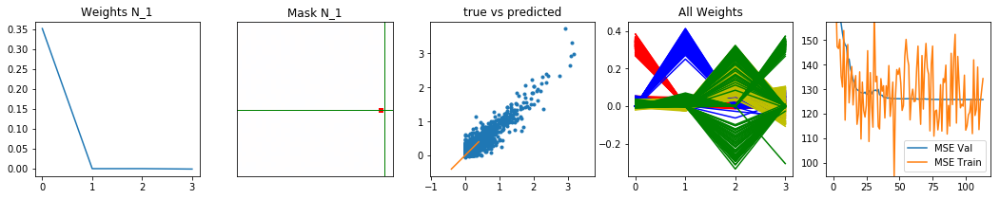

Runs: 11500; MSE - train: 119.512, val: 125.744219422; lr = 1e-05
Loss: 0.0 mask Loss: 1.47481430054 weights
latest:  125.744219422
FEV =  0.683637413158
best:  112 125.736962795


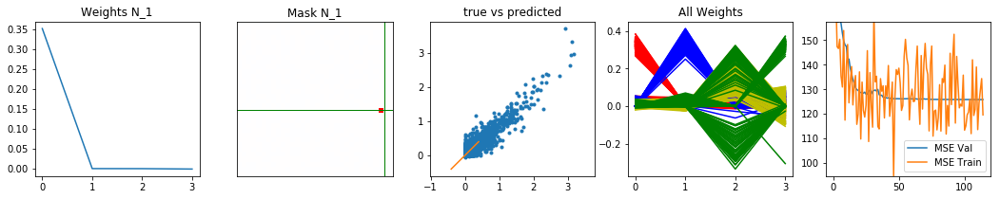

Runs: 11600; MSE - train: 123.512, val: 125.756043673; lr = 1e-05
Loss: 0.0 mask Loss: 1.47482559204 weights
latest:  125.756043673
FEV =  0.683360447227
best:  112 125.736962795


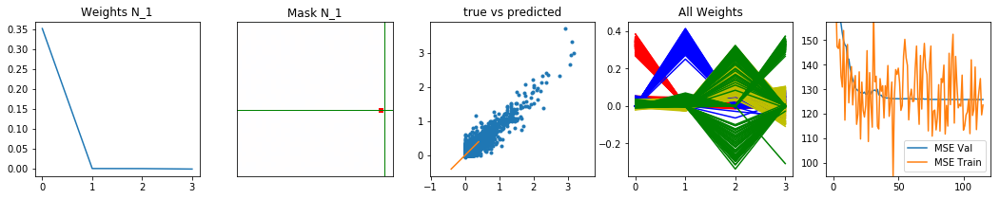

Runs: 11700; MSE - train: 134.087, val: 125.747795224; lr = 1e-05
Loss: 0.0 mask Loss: 1.47483718872 weights
latest:  125.747795224
FEV =  0.683515896527
best:  112 125.736962795


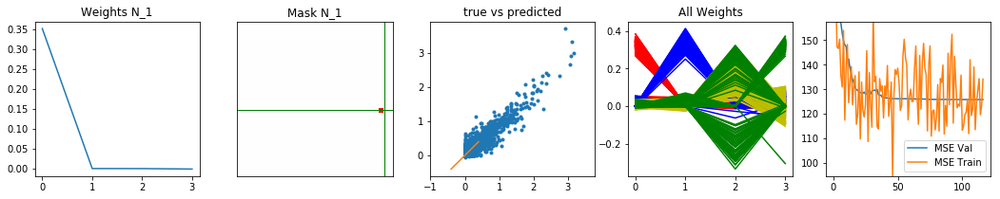

Runs: 11800; MSE - train: 109.995, val: 125.736763477; lr = 1e-05
Loss: 0.0 mask Loss: 1.47474746704 weights
latest:  125.736763477
FEV =  0.683591583451
best:  117 125.736763477


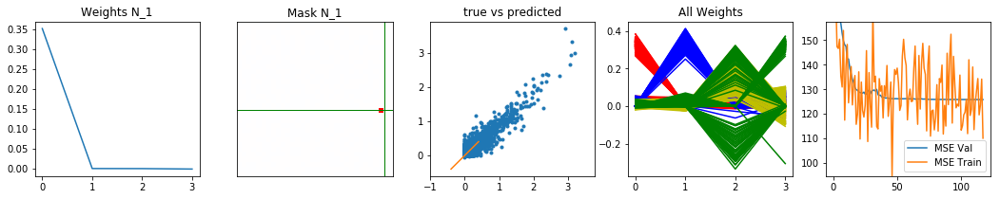

Runs: 11900; MSE - train: 129.625, val: 125.744316339; lr = 1e-05
Loss: 0.0 mask Loss: 1.47457061768 weights
latest:  125.744316339
FEV =  0.683614777337
best:  117 125.736763477


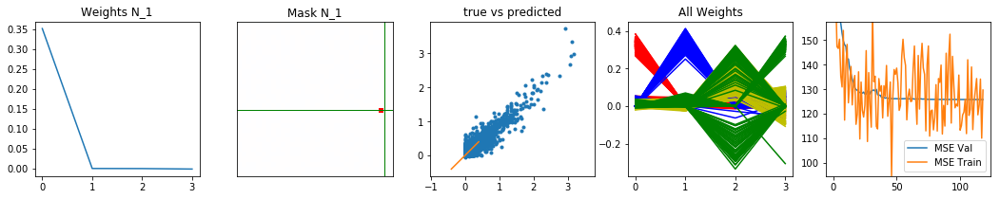

Runs: 12000; MSE - train: 125.199, val: 125.737228274; lr = 1e-05
Loss: 0.0 mask Loss: 1.47453445435 weights
latest:  125.737228274
FEV =  0.683668903211
best:  117 125.736763477


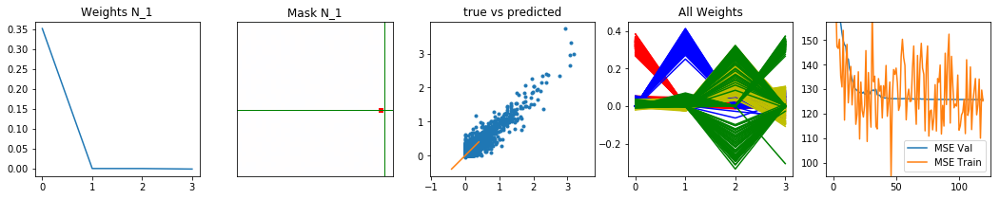

Runs: 12100; MSE - train: 121.286, val: 125.736392498; lr = 1e-05
Loss: 0.0 mask Loss: 1.47456665039 weights
latest:  125.736392498
FEV =  0.683693886426
best:  120 125.736392498


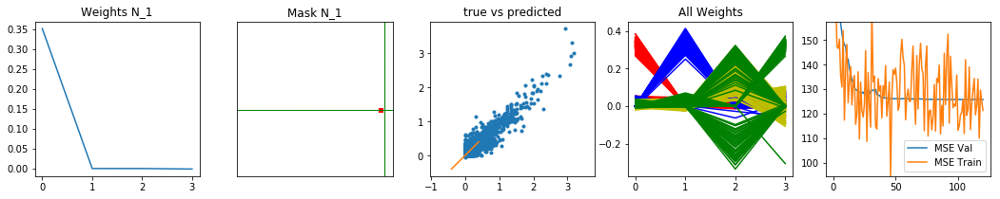

Runs: 12200; MSE - train: 134.79, val: 125.747419715; lr = 1e-05
Loss: 0.0 mask Loss: 1.47465698242 weights
latest:  125.747419715
FEV =  0.683484460596
best:  120 125.736392498


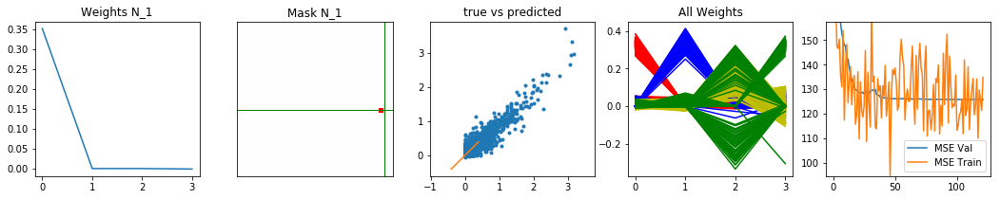

Runs: 12300; MSE - train: 113.665, val: 125.73235774; lr = 1e-05
Loss: 0.0 mask Loss: 1.47465560913 weights
latest:  125.73235774
FEV =  0.68377892744
best:  122 125.73235774


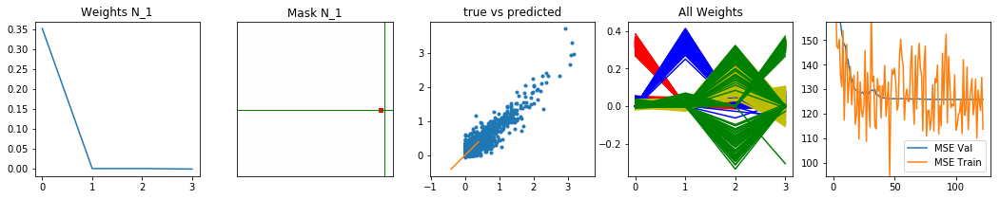

Runs: 12400; MSE - train: 117.911, val: 125.729464173; lr = 1e-05
Loss: 0.0 mask Loss: 1.47464614868 weights
latest:  125.729464173
FEV =  0.683764765979
best:  123 125.729464173


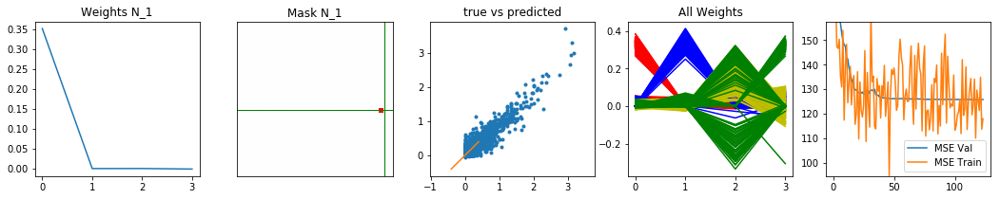

Runs: 12500; MSE - train: 119.428, val: 125.732793331; lr = 1e-05
Loss: 0.0 mask Loss: 1.47454833984 weights
latest:  125.732793331
FEV =  0.683693172379
best:  123 125.729464173


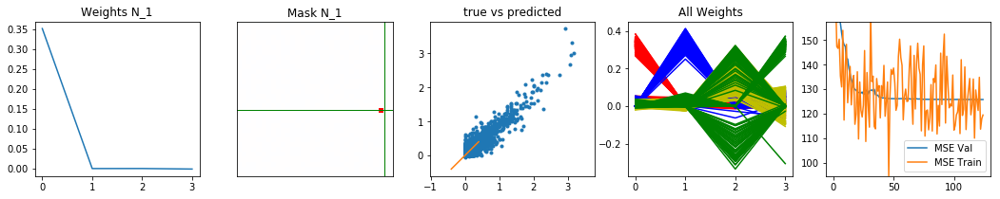

Runs: 12600; MSE - train: 128.93, val: 125.749832749; lr = 1e-05
Loss: 0.0 mask Loss: 1.47426132202 weights
latest:  125.749832749
FEV =  0.683535863289
best:  123 125.729464173


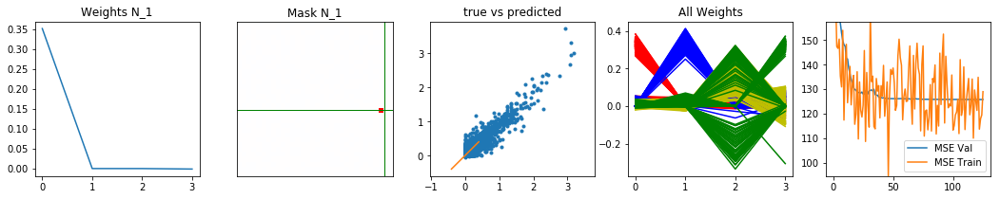

Runs: 12700; MSE - train: 127.737, val: 125.723215103; lr = 1e-05
Loss: 0.0 mask Loss: 1.47437805176 weights
latest:  125.723215103
FEV =  0.683815064286
best:  126 125.723215103


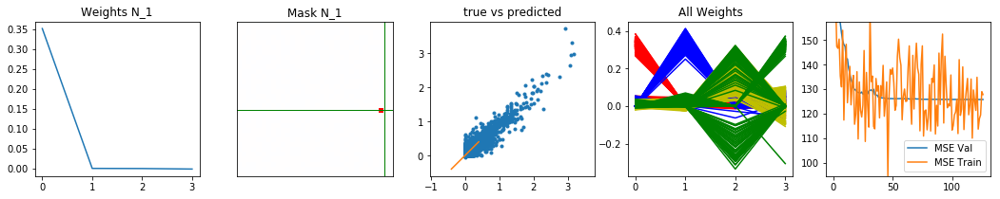

Runs: 12800; MSE - train: 145.802, val: 125.737236261; lr = 1e-05
Loss: 0.0 mask Loss: 1.47430526733 weights
latest:  125.737236261
FEV =  0.683698516625
best:  126 125.723215103


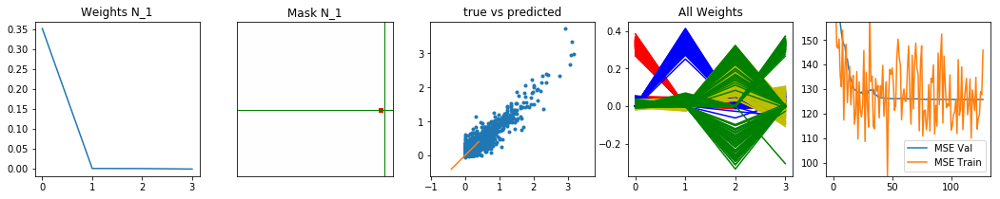

Runs: 12900; MSE - train: 123.31, val: 125.734176755; lr = 1e-05
Loss: 0.0 mask Loss: 1.47437225342 weights
latest:  125.734176755
FEV =  0.683678989474
best:  126 125.723215103


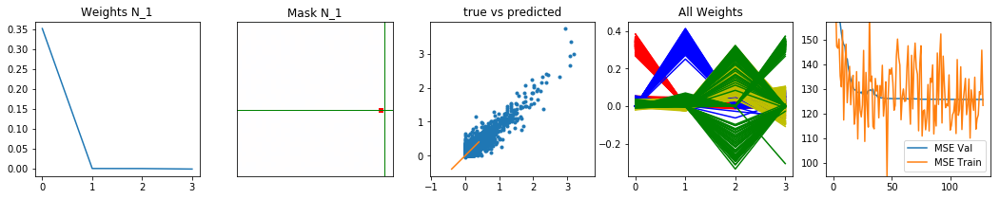

Runs: 13000; MSE - train: 117.163, val: 125.720913768; lr = 1e-05
Loss: 0.0 mask Loss: 1.47429138184 weights
latest:  125.720913768
FEV =  0.68385424215
best:  129 125.720913768


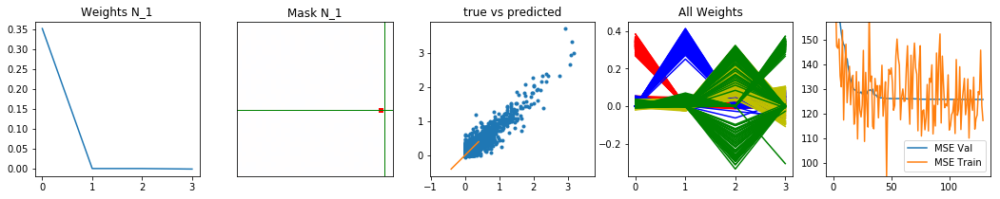

Runs: 13100; MSE - train: 117.77, val: 125.727074385; lr = 1e-05
Loss: 0.0 mask Loss: 1.47416717529 weights
latest:  125.727074385
FEV =  0.683750870275
best:  129 125.720913768


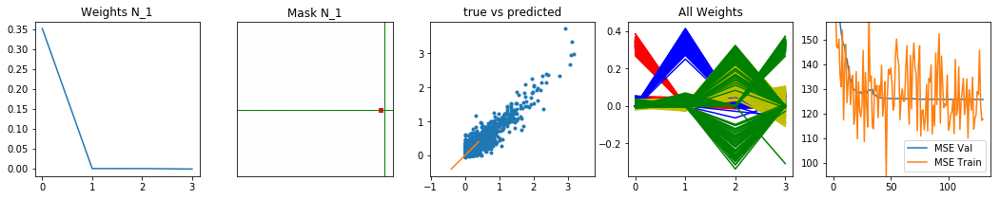

Runs: 13200; MSE - train: 126.391, val: 125.725162029; lr = 1e-05
Loss: 0.0 mask Loss: 1.47419799805 weights
latest:  125.725162029
FEV =  0.683830489945
best:  129 125.720913768


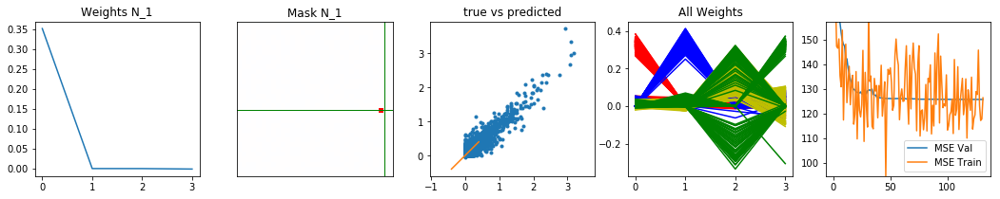

Runs: 13300; MSE - train: 120.018, val: 125.733991623; lr = 1e-05
Loss: 0.0 mask Loss: 1.47423904419 weights
latest:  125.733991623
FEV =  0.683746396313
best:  129 125.720913768


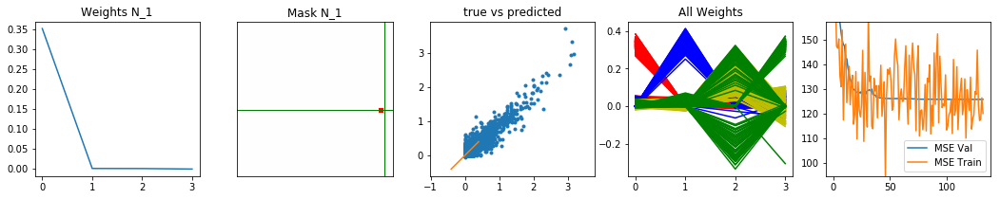

Runs: 13400; MSE - train: 132.204, val: 125.724919081; lr = 1e-05
Loss: 0.0 mask Loss: 1.47414245605 weights
latest:  125.724919081
FEV =  0.683859996393
best:  129 125.720913768


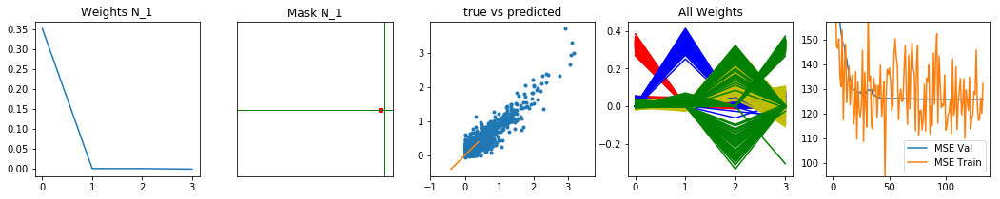

Runs: 13500; MSE - train: 116.047, val: 125.719663262; lr = 1e-05
Loss: 0.0 mask Loss: 1.47423751831 weights
latest:  125.719663262
FEV =  0.683820656675
best:  134 125.719663262


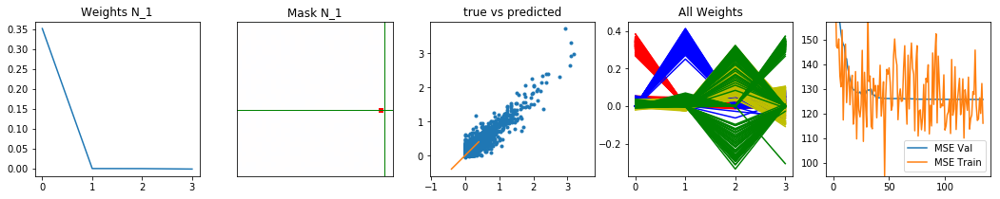

Runs: 13600; MSE - train: 105.839, val: 125.736095905; lr = 1e-05
Loss: 0.0 mask Loss: 1.47408218384 weights
latest:  125.736095905
FEV =  0.683701039659
best:  134 125.719663262


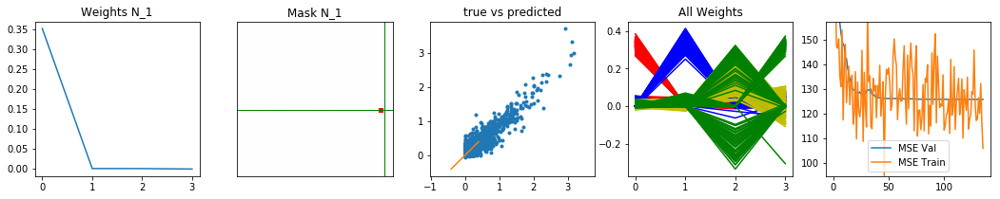

Runs: 13700; MSE - train: 117.647, val: 125.731652617; lr = 1e-05
Loss: 0.0 mask Loss: 1.47405426025 weights
latest:  125.731652617
FEV =  0.68369896951
best:  134 125.719663262


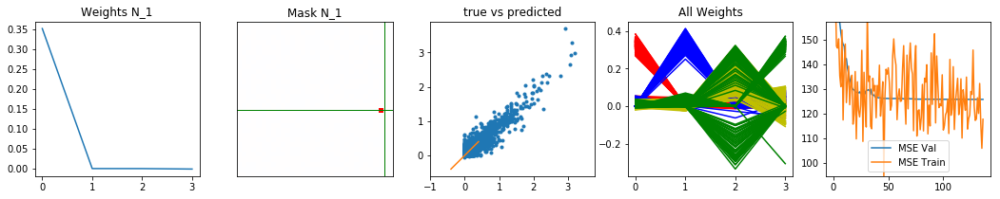

Runs: 13800; MSE - train: 118.273, val: 125.720858812; lr = 1e-05
Loss: 0.0 mask Loss: 1.47393341064 weights
latest:  125.720858812
FEV =  0.683917645528
best:  134 125.719663262


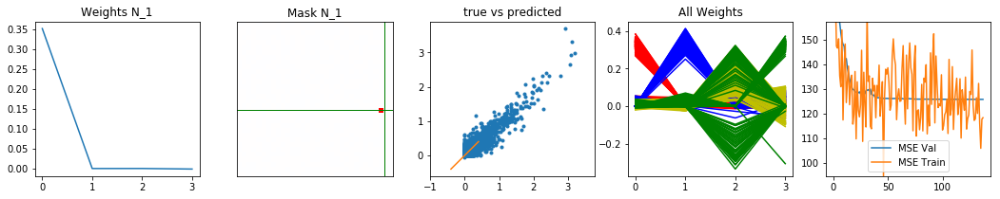

Runs: 13900; MSE - train: 135.29, val: 125.717016339; lr = 1e-05
Loss: 0.0 mask Loss: 1.4740184021 weights
latest:  125.717016339
FEV =  0.683941051049
best:  138 125.717016339


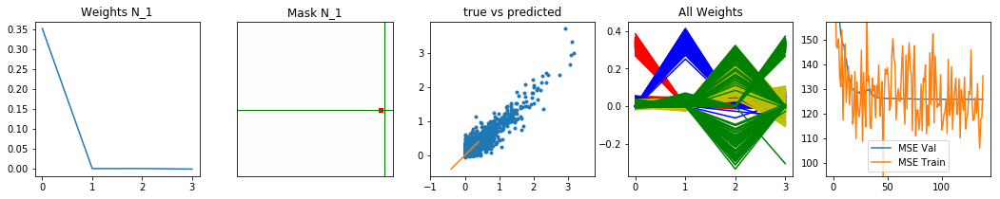

Runs: 14000; MSE - train: 137.525, val: 125.729446054; lr = 1e-05
Loss: 0.0 mask Loss: 1.47404296875 weights
latest:  125.729446054
FEV =  0.683790014696
best:  138 125.717016339


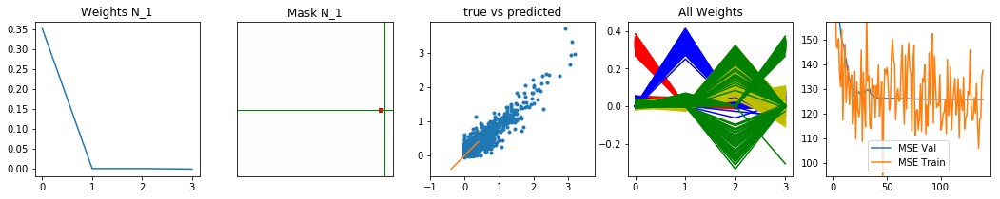

Runs: 14100; MSE - train: 126.772, val: 125.721668959; lr = 1e-05
Loss: 0.0 mask Loss: 1.47399200439 weights
latest:  125.721668959
FEV =  0.683906329532
best:  138 125.717016339


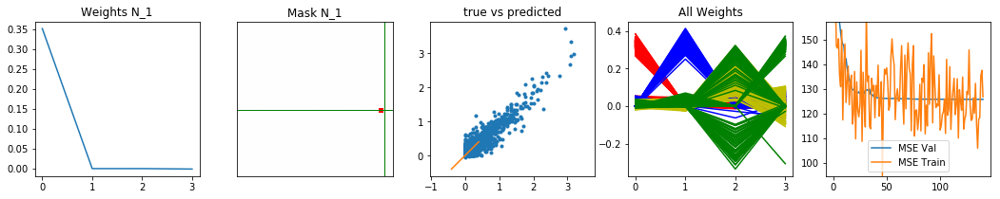

Runs: 14200; MSE - train: 137.159, val: 125.724679112; lr = 1e-05
Loss: 0.0 mask Loss: 1.47379928589 weights
latest:  125.724679112
FEV =  0.683819520888
best:  138 125.717016339


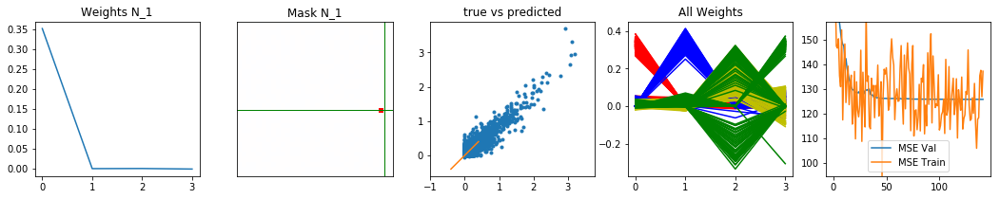

Runs: 14300; MSE - train: 136.768, val: 125.711082697; lr = 1e-05
Loss: 0.0 mask Loss: 1.4738218689 weights
latest:  125.711082697
FEV =  0.683993570382
best:  142 125.711082697


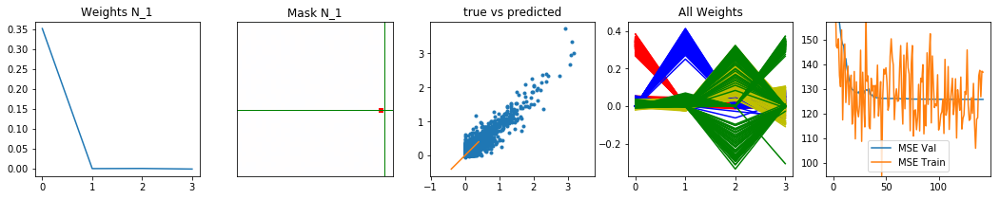

Runs: 14400; MSE - train: 124.417, val: 125.720406532; lr = 1e-05
Loss: 0.0 mask Loss: 1.47396911621 weights
latest:  125.720406532
FEV =  0.683905611145
best:  142 125.711082697


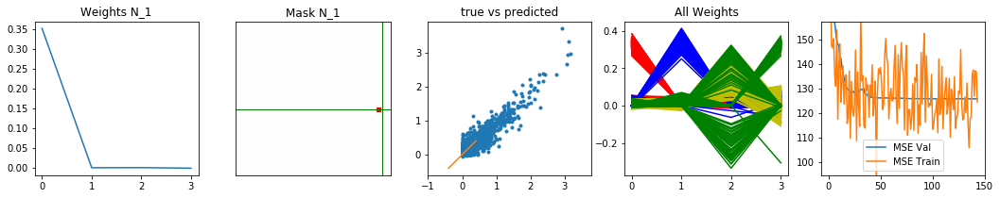

Runs: 14500; MSE - train: 144.361, val: 125.716360807; lr = 1e-05
Loss: 0.0 mask Loss: 1.47392547607 weights
latest:  125.716360807
FEV =  0.683977827653
best:  142 125.711082697


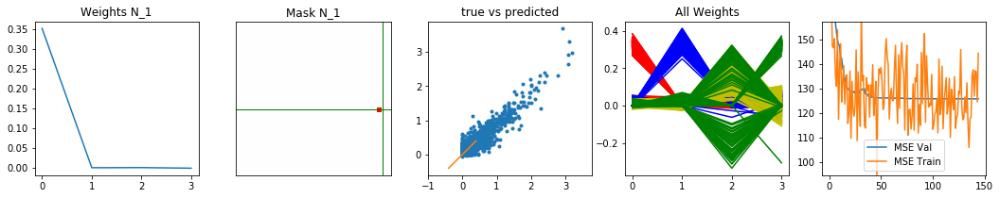

Runs: 14600; MSE - train: 113.299, val: 125.709363699; lr = 1e-05
Loss: 0.0 mask Loss: 1.47380889893 weights
latest:  125.709363699
FEV =  0.684024920536
best:  145 125.709363699


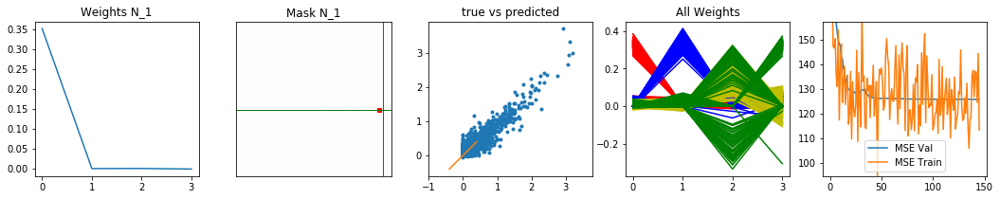

Runs: 14700; MSE - train: 129.251, val: 125.702424049; lr = 1e-05
Loss: 0.0 mask Loss: 1.47381271362 weights
latest:  125.702424049
FEV =  0.684037494602
best:  146 125.702424049


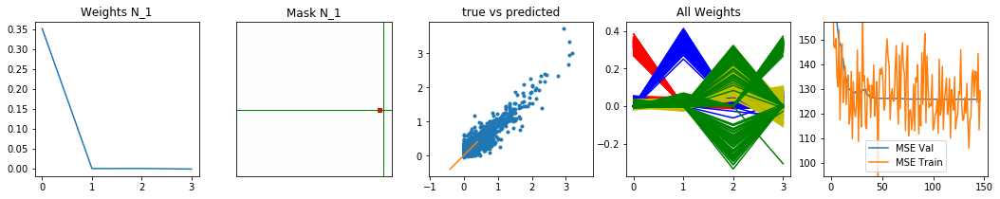

Runs: 14800; MSE - train: 128.454, val: 125.71338737; lr = 1e-05
Loss: 0.0 mask Loss: 1.47373474121 weights
latest:  125.71338737
FEV =  0.683991678171
best:  146 125.702424049


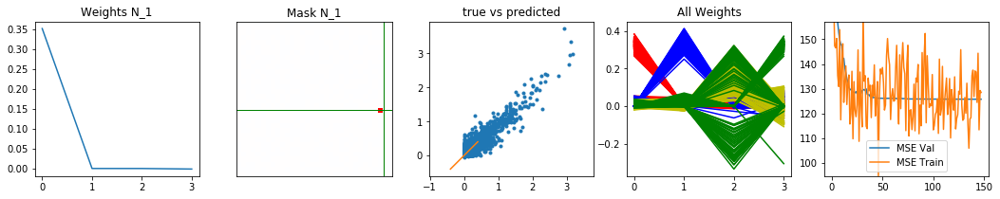

Runs: 14900; MSE - train: 137.32, val: 125.706327081; lr = 1e-05
Loss: 0.0 mask Loss: 1.47374313354 weights
latest:  125.706327081
FEV =  0.684079346376
best:  146 125.702424049


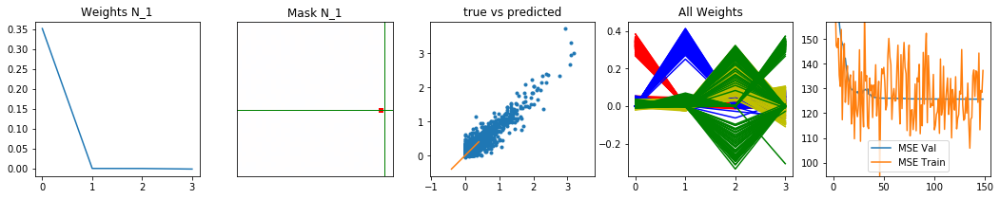

('Stop at run 14999; MSE on validation set: 125.702424049', 'MSE on test set: 25.659226459; FEV: 0.684037497666')


In [9]:
##Cross validation for parameters...
start=time.time()
#Parameters:
N=1000
s1=44#width=heigth of image
s2=5
s3=32
n_B = [32,64,4]#number of bases to learn
init_scaleK = .01#Kernel
init_scaleM = .001#Mask
init_scaleW = [1/n_B[-1],.01]#Read out Weights,    1/n_B[-1]
lr= .001 # initial learning rate
rM = 0#.05#regularization on Mask
rW = .005#[.0005,.001,.003,.0009,.0008,.0007,.0006,.0005,.0004,.0003,.0002,.0001]
#.005#regularization on Read-out Weights
#loop parameters
max_runs = 15000 # training steps
batch_size = 64
    
#Clean previous checkpoints
files = os.listdir()
for file in files:
    if file.startswith("bn_checkpoint"):
        os.remove(file)

#prepare data
num_test=batch_size*92
num_train=2**15
num_val=np.int(num_train/8)
num_train-=num_val

#Y_train_orig,X_train_orig,X_test,GT_test = generate_data(X,Y,num_test)
GT_test = GT_test_orig[:,:num_test]
X_test = X_test_orig[:num_test,:,:,:]
X_train=X_train_orig[:num_train,:,:,:]
X_val=X_train_orig[num_train:num_train+num_val,:,:,:]
Y_train=Y_train_orig[:,:num_train]
Y_val=Y_train_orig[:,num_train:num_train+num_val]

X_sta=np.mean(X_train,axis=1).reshape([-1,s1**2]).T
tmp_sta,_ = STA(X_sta,Y_train,s3)

start=time.time()
WK1,WK2,WK3,WM_tmp,WW_tmp,MSE_train,MSE_val,MSE_test,FEV4,fev_c,Y_tmp,_ = train(init_scaleK,
                                                   init_scaleM,init_scaleW,lr,n_B,
                                               max_runs,rM,rW,[s1,s2,s3],N,X_train,X_val,X_test,
                                               Y_train,Y_val,GT_test,batch_size,verbose=True)

# Testing

In [17]:
# Test
start=time.time()
#Parameters:
N=1000
s1=44#width=heigth of image
s2=5
s3=32
n_B = [32,64,4]#number of bases to learn
init_scaleK = .01#Kernel
init_scaleM = .001#Mask
init_scaleW = [1/n_B[-1],.01]#Read out Weights,    1/n_B[-1]
lr= .001 # initial learning rate
rM = 0#.05#regularization on Mask
rW = .001#[.00001,.0001,.001,.01,.1]#tried:.005
#loop parameters
max_runs = 15000 # training steps
batch_size = 64
    
#Clean previous checkpoints
files = os.listdir()
for file in files:
    if file.startswith("bn_checkpoint"):
        os.remove(file)

#Seeds
np_seed=1295
np.random.seed(np_seed)

#Data, keep test set for later
num_test = 2**10
ind = np.random.choice(X.shape[0],X.shape[0],replace=False)
X_TEST = X[ind[:num_test],...]
GT_TEST = (Y[:,ind[:num_test]].T / np.mean(Y,1)).T * .1#mean response=.1
X_try = X[ind[num_test:],...]
Y_try = Y[:,ind[num_test:]]
        
data_sets=2**np.arange(9,17)

reps=3

FEV=np.zeros([reps,len(data_sets)])
Val=np.zeros([reps,len(data_sets)])

for r in range(reps):
    for d in range(len(data_sets)):
        print('rep %s, data = %s'%(r,data_sets[d]))
        #Data
        num_train=np.min([data_sets[d],Y_try.shape[1]])#number of training+val images
        num_val = num_train//8#number of val
        num_train -= num_val#number of train
        Y_train,Y_val,X_train,X_val,_,_ = splitting_data(X=X_try,Y=Y_try,
           num_train=num_train,num_test=0,num_val=num_val,noise=True,mean_response=.1)

        print('Images for Training: %s, Validation: %s, Testing %s'%(
            Y_train.shape[1],Y_val.shape[1],GT_TEST.shape[1]))

        X_sta=np.mean(X_train,axis=1).reshape([-1,s1**2]).T
        tmp_sta,_ = STA(X_sta,Y_train,s3)

        WK1,WK2,WK3,WM_tmp,WW_tmp,MSE_train,tmp,MSE_test,FEV[r,d],fev_c,Y_tmp,_ = train(init_scaleK,
                                                               init_scaleM,init_scaleW,lr,n_B,
                                                           max_runs,rM,rW,[s1,s2,s3],N,X_train,X_val,X_TEST,
                                                           Y_train,Y_val,GT_TEST,batch_size,verbose=False)
        Val[r,d] = np.min(tmp)
np.savez('Batty_fit',FEV=FEV,Val=Val)

rep 0, data = 512
Images for Training: 448, Validation: 64, Testing 1024
('Stop at run 3100; MSE on validation set: 169.52911377', 'MSE on test set: 67.1777932644; FEV: 0.146712806618')
rep 0, data = 1024
Images for Training: 896, Validation: 128, Testing 1024
('Stop at run 3000; MSE on validation set: 154.288414001', 'MSE on test set: 59.9759876728; FEV: 0.238189590566')
rep 0, data = 2048
Images for Training: 1792, Validation: 256, Testing 1024
('Stop at run 4500; MSE on validation set: 141.20791626', 'MSE on test set: 50.1139814854; FEV: 0.363456039073')
rep 0, data = 4096
Images for Training: 3584, Validation: 512, Testing 1024
('Stop at run 5000; MSE on validation set: 128.521770477', 'MSE on test set: 34.3167991638; FEV: 0.56411064101')
rep 0, data = 8192
Images for Training: 7168, Validation: 1024, Testing 1024
('Stop at run 9500; MSE on validation set: 136.87698555', 'MSE on test set: 29.7112005949; FEV: 0.622610601872')
rep 0, data = 16384
Images for Training: 14336, Validatio